Insurance Claims- Fraud Detection

Problem Statement:

Business case:

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, We are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

Prediction:

In this example, We will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

 

In [1]:
#import all libaries
import pandas as pd
import numpy as np
import statistics
import seaborn as sns
from matplotlib import pyplot as plt
import sklearn
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
import warnings
warnings.filterwarnings('ignore')
url="https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv"



In [2]:
#stroing into csv file
df = pd.read_csv(url)
df.to_csv("Insurance_Claims_Fraud_Detection_.csv",sep='\t')

In [3]:
#create dataframe
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [4]:
df.shape

(1000, 40)

Here months_as_customer,age,policy_number,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,bodily_injuries,total_claim_amount,injury_claim,property_claim,vehicle_claim,witnesses,auto_year are the columns which has categorical ordinal data type.

policy_bind_date,incident_date are the columns which has date type categorical ordinal data type.

policy_deductable,number_of_vehicles_involved,bodily_injuries,witnesses,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,property_damage,police_report_available,auto_make,auto_model are the columns which has categorical nominal data type.

policy_annual_premium is the column which has continous data type values.

Our Target column is the fraud_reported which has categorical nominal data type.Since this is the Target column which we are going to predict Hence it is a Classification problem.


In [5]:
df.columns #checking column names

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

EDA:

In [7]:
df.isnull().sum() #checking null values

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [8]:
df=df.drop(['_c39'],axis=1)

drop this column since it has none values in entire rows

In [9]:
df.shape

(1000, 39)

In [10]:
df.apply(lambda x: len(x.unique())) # getting unique values of all the columns

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

In [11]:
df['fraud_reported'] = df['fraud_reported'].replace(('Y','N'),(0,1))

#change column values to 0 and 1

In [12]:
df['collision_type']=df['collision_type'].replace("?","Not Applicable")

#change empty values to not applicable

In [13]:
df['umbrella_limit'].value_counts()

 0           798
 6000000      57
 5000000      46
 4000000      39
 7000000      29
 3000000      12
 8000000       8
 9000000       5
 2000000       3
 10000000      2
-1000000       1
Name: umbrella_limit, dtype: int64

#more than 50% of rows has 0 values.so we can drop this column

In [14]:
df['capital-gains'].value_counts()

0        508
46300      5
68500      4
51500      4
45500      3
        ... 
54700      1
40100      1
33200      1
37300      1
72700      1
Name: capital-gains, Length: 338, dtype: int64

#more than 50% of rows has 0 values.so we can drop this column

In [15]:
df['capital-loss'].value_counts()

 0        475
-53700      5
-50300      5
-31700      5
-51000      4
         ... 
-43300      1
-66100      1
-55900      1
-66500      1
-48000      1
Name: capital-loss, Length: 354, dtype: int64

#more than 30% of rows has 0 values.so we can drop this column

In [16]:
df['collision_type'].value_counts(normalize=True) 

Rear Collision     0.292
Side Collision     0.276
Front Collision    0.254
Not Applicable     0.178
Name: collision_type, dtype: float64

Rear collision happened has higher %

In [17]:
df['property_damage'].value_counts()

?      360
NO     338
YES    302
Name: property_damage, dtype: int64

#more than 30% of rows has 0 values.so we can drop this column

In [18]:
df['police_report_available'].value_counts()

?      343
NO     343
YES    314
Name: police_report_available, dtype: int64

police report not available has higher percentage

In [19]:
df['bodily_injuries'].value_counts()

0    340
2    332
1    328
Name: bodily_injuries, dtype: int64

no injuries has higher percentage of occurence

In [20]:
df['authorities_contacted'].value_counts(normalize=True)

Police       0.292
Fire         0.223
Other        0.198
Ambulance    0.196
None         0.091
Name: authorities_contacted, dtype: float64

contacted police after incident has higher percentage of occurence

In [21]:
df['incident_hour_of_the_day'].value_counts()

17    54
3     53
0     52
23    51
16    49
4     46
10    46
13    46
6     44
14    43
9     43
21    42
18    41
7     40
19    40
12    40
15    39
22    38
8     36
20    34
5     33
2     31
11    30
1     29
Name: incident_hour_of_the_day, dtype: int64

most incidents happened at 17 th hour

In [22]:
df['witnesses'].value_counts()

1    258
2    250
0    249
3    243
Name: witnesses, dtype: int64

witness number atleast one is higher and there should be

<AxesSubplot:>

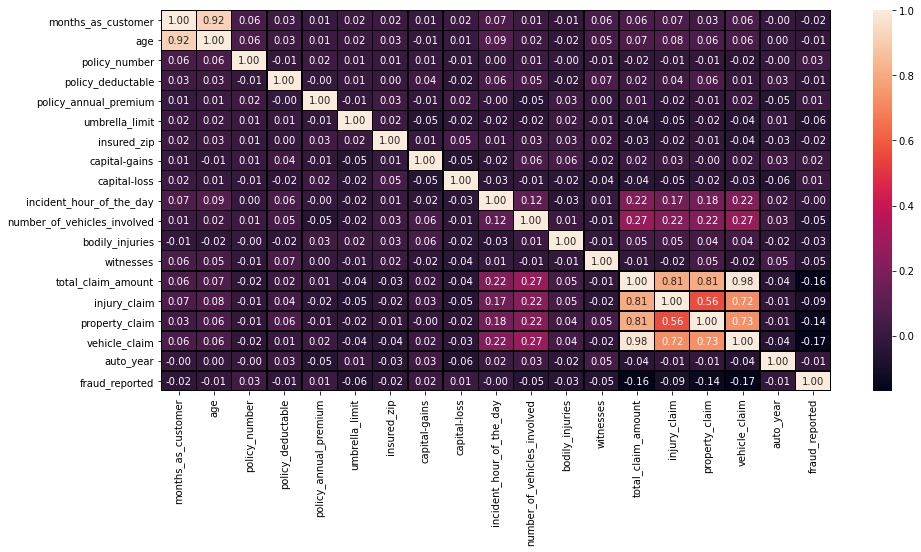

In [23]:
plt.figure(figsize=(15,7))
sns.heatmap(df.corr(),annot=True,linewidths=0.5,linecolor="black",fmt='.2f')

total claim amount is the sum of all the claim columns.so we can keep this column and drop all other columns

In [24]:
# replace empty values of the columns by mean,most frequent values
import numpy as np
from sklearn.impute import SimpleImputer
for col in ['authorities_contacted','incident_hour_of_the_day']:
    imp=SimpleImputer(missing_values=np.NaN,strategy="most_frequent")
    df[col]=imp.fit_transform(df[col].values.reshape(-1,1))

In [25]:
#Looking at below claim_amount:
a_claims=pd.pivot_table(df,values='total_claim_amount',index=['insured_occupation','insured_education_level']).sort_values('total_claim_amount',ascending=False)

cm=sns.light_palette("black", as_cmap=True)
a_claims.style.background_gradient(cmap=cm)

prof-specialty,	Masters had  higher total claim amount of 75788.888889

In [26]:
df[['auto_model','fraud_reported']].groupby(['auto_model'], 
                as_index = False).mean().sort_values(by = 'fraud_reported', ascending = False)

,auto_model,fraud_reported
0,3 Series,0.944444
31,RSX,0.916667
25,Malibu,0.900000
36,Wrangler,0.880952
29,Pathfinder,0.870968
35,Ultima,0.869565
9,Camry,0.857143
11,Corolla,0.850000
8,CRV,0.850000
21,Legacy,0.843750


3 series auto model has higher chance of fraud reported

In [27]:
df[['auto_make','fraud_reported']].groupby(['auto_make'], 
                as_index = False).mean().sort_values(by = 'fraud_reported', ascending = False)

,auto_make,fraud_reported
7,Jeep,0.835821
9,Nissan,0.820513
12,Toyota,0.814286
0,Accura,0.808824
10,Saab,0.775000
11,Suburu,0.762500
4,Dodge,0.750000
6,Honda,0.745455
3,Chevrolet,0.723684
2,BMW,0.722222


most fraud reported  are from jeep make than others

In [28]:
df[['property_damage','fraud_reported']].groupby(['property_damage'], 
                as_index = False).mean().sort_values(by = 'fraud_reported', ascending = False)

,property_damage,fraud_reported
1,NO,0.804734
2,YES,0.741722
0,?,0.713889


mostly no property damage is high when compared with damage

In [29]:
df[['incident_city','fraud_reported']].groupby(['incident_city'], 
                as_index = False).mean().sort_values(by = 'fraud_reported', ascending = False)

,incident_city,fraud_reported
4,Northbrook,0.778689
5,Riverwood,0.776119
3,Northbend,0.765517
6,Springfield,0.757962
2,Hillsdale,0.751773
1,Columbus,0.738255
0,Arlington,0.710526


Northbrook	city has higher chance of fraud reported

In [30]:
df[['incident_state','fraud_reported']].groupby(['incident_state'], 
                as_index = False).mean().sort_values(by = 'fraud_reported', ascending = False)


,incident_state,fraud_reported
6,WV,0.820276
1,NY,0.778626
5,VA,0.772727
3,PA,0.733333
4,SC,0.705645
0,NC,0.690909
2,OH,0.565217


WV incident state has higher chance of fraud reported

In [31]:
df[['authorities_contacted','fraud_reported']].groupby(['authorities_contacted'], 
                as_index = False).mean().sort_values(by = 'fraud_reported', ascending = False)

,authorities_contacted,fraud_reported
2,None,0.934066
4,Police,0.791096
1,Fire,0.730942
0,Ambulance,0.709184
3,Other,0.681818


no authorities contacted has higher chance of fraud reported

In [32]:
df[['incident_severity','fraud_reported']].groupby(['incident_severity'], 
                as_index = False).mean().sort_values(by = 'fraud_reported', ascending = False)

,incident_severity,fraud_reported
3,Trivial Damage,0.933333
1,Minor Damage,0.892655
2,Total Loss,0.871429
0,Major Damage,0.394928


Trivial damage has mos occurence

In [33]:
df[['collision_type','fraud_reported']].groupby(['collision_type'], 
                as_index = False).mean().sort_values(by = 'fraud_reported', ascending = False)

,collision_type,fraud_reported
1,Not Applicable,0.910112
3,Side Collision,0.746377
0,Front Collision,0.724409
2,Rear Collision,0.688356


unknown collision has most occurence

In [34]:

df[['incident_type','fraud_reported']].groupby(['incident_type'], 
                as_index = False).mean().sort_values(by = 'fraud_reported', ascending = False)

,incident_type,fraud_reported
3,Vehicle Theft,0.914894
1,Parked Car,0.904762
0,Multi-vehicle Collision,0.727924
2,Single Vehicle Collision,0.709677


vehicle theft has most fraud_reported

create month and year columns for analysis purpose

In [35]:
import calendar
  
df['incident_date'] = pd.to_datetime(df['incident_date'], errors = 'coerce')

# extracting days and month from date
df['incident_month'] = df['incident_date'].dt.month
df['incident_month']=df['incident_month'].apply(lambda x: calendar.month_abbr[x])


In [36]:
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,incident_month
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,0,Jan
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,0,Jan
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,1,Feb
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,0,Oct
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,1,Feb
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,1,Feb
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,1,Jan
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,1,Jan
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,1,Feb


In [37]:
# let's know the relation between insured_relationship and fraud reported

df[['insured_relationship','fraud_reported']].groupby(['insured_relationship'], 
                as_index = False).mean().sort_values(by = 'fraud_reported', ascending = False)

,insured_relationship,fraud_reported
0,husband,0.794118
3,own-child,0.786885
4,unmarried,0.758865
1,not-in-family,0.741379
5,wife,0.729032
2,other-relative,0.706215


insured relationship  husband has most fraud reported

In [38]:
df[['insured_hobbies','fraud_reported']].groupby(['insured_hobbies'], 
                as_index = False).mean().sort_values(by = 'fraud_reported', ascending = False)

,insured_hobbies,fraud_reported
4,camping,0.909091
11,kayaking,0.907407
9,golf,0.890909
7,dancing,0.883721
3,bungie-jumping,0.839286
12,movies,0.836364
1,basketball,0.823529
8,exercise,0.807018
17,sleeping,0.804878
18,video-games,0.800000


camping hobby has most fraud reported

In [39]:
df[['insured_occupation','fraud_reported']].groupby(['insured_occupation'], 
                as_index = False).mean().sort_values(by = 'fraud_reported', ascending = False)

,insured_occupation,fraud_reported
7,other-service,0.830986
8,priv-house-serv,0.830986
0,adm-clerical,0.830769
5,handlers-cleaners,0.796296
9,prof-specialty,0.788235
10,protective-serv,0.777778
6,machine-op-inspct,0.763441
1,armed-forces,0.753623
11,sales,0.723684
12,tech-support,0.717949


other service occupation has most fraud reported

In [40]:
df[['insured_education_level','fraud_reported']].groupby(['insured_education_level'], 
                as_index = False).mean().sort_values(by = 'fraud_reported', ascending = False)

,insured_education_level,fraud_reported
5,Masters,0.776224
2,High School,0.775000
0,Associate,0.765517
3,JD,0.739130
1,College,0.737705
4,MD,0.736111
6,PhD,0.736000


masters education has most fraud reported

In [41]:

df[['insured_sex','fraud_reported']].groupby(['insured_sex'], as_index = False).mean().sort_values(
    by = 'fraud_reported', ascending = False)

,insured_sex,fraud_reported
0,FEMALE,0.765363
1,MALE,0.738661


females has most fraud reported occurence

In [42]:

df[['policy_csl','fraud_reported']].groupby(['policy_csl'], as_index = False).mean().sort_values(
    by = 'fraud_reported', ascending = False)

,policy_csl,fraud_reported
2,500/1000,0.783333
0,100/300,0.742120
1,250/500,0.737892


policy number 500/1000	has most fraud reported occurence

In [43]:
df[['policy_state','fraud_reported']].groupby(['policy_state'], as_index = False).mean().sort_values(
    by = 'fraud_reported', ascending = False)

,policy_state,fraud_reported
0,IL,0.772189
1,IN,0.745161
2,OH,0.741477


policy state IL has most fraud reported occurence

In [44]:
df['fraud_reported'].value_counts()

1    753
0    247
Name: fraud_reported, dtype: int64

 fraud reported occurence is more than not reported 

In [45]:
claim_cause1=df.groupby('auto_model', as_index=False).agg({"total_claim_amount":["sum","mean","count"]})
print(claim_cause1)

        auto_model total_claim_amount                    
                                  sum          mean count
0         3 Series             945420  52523.333333    18
1              92x            1524770  54456.071429    28
2               93            1267930  50717.200000    25
3               95            1322930  48997.407407    27
4               A3            2093620  56584.324324    37
5               A5            1658860  51839.375000    32
6           Accord             638350  49103.846154    13
7             C300            1109520  61640.000000    18
8              CRV            1139210  56960.500000    20
9            Camry            1151430  41122.500000    28
10           Civic            1066760  48489.090909    22
11         Corolla             931280  46564.000000    20
12            E400            1103760  40880.000000    27
13          Escape            1532760  63865.000000    24
14            F150            1330000  49259.259259    27
15       Forre

this shows auto models and their total claim amount

In [46]:
claim_cause1=df.groupby('policy_state', as_index=False).agg({"total_claim_amount":["sum","mean","count"]})
print(claim_cause1)

  policy_state total_claim_amount                    
                              sum          mean count
0           IL           17861330  52844.171598   338
1           IN           16432160  53006.967742   310
2           OH           18468450  52467.187500   352


policy state IN has high total claim amount

In [47]:
claim_cause1=df.groupby('policy_state', as_index=False).agg({"fraud_reported":["sum","count"]})
print(claim_cause1)

  policy_state fraud_reported      
                          sum count
0           IL            261   338
1           IN            231   310
2           OH            261   352


policy state IL has most fraud reported

In [48]:
claim_cause1=df.groupby('auto_model', as_index=False).agg({"fraud_reported":["sum","mean","count"]})
print(claim_cause1)

        auto_model fraud_reported                
                              sum      mean count
0         3 Series             17  0.944444    18
1              92x             20  0.714286    28
2               93             20  0.800000    25
3               95             22  0.814815    27
4               A3             27  0.729730    37
5               A5             21  0.656250    32
6           Accord             10  0.769231    13
7             C300             11  0.611111    18
8              CRV             17  0.850000    20
9            Camry             24  0.857143    28
10           Civic             14  0.636364    22
11         Corolla             17  0.850000    20
12            E400             20  0.740741    27
13          Escape             18  0.750000    24
14            F150             17  0.629630    27
15       Forrestor             20  0.714286    28
16          Fusion             15  0.714286    21
17  Grand Cherokee             19  0.760000    25


this shows auto model and their fraud reported

In [49]:
df['vehicle_age'] = 2015 - df['auto_year'] # Deriving the age of the vehicle based on the year value 
df['vehicle_age']

0      11
1       8
2       8
3       1
4       6
       ..
995     9
996     0
997    19
998    17
999     8
Name: vehicle_age, Length: 1000, dtype: int64

In [50]:
a=df[df['fraud_reported']==1]
a[['policy_number','insured_occupation','insured_education_level','total_claim_amount']].sort_values('total_claim_amount',ascending=False)[:20]

,policy_number,insured_occupation,insured_education_level,total_claim_amount
11,214618,exec-managerial,High School,114920
996,186934,prof-specialty,PhD,108480
565,556415,exec-managerial,PhD,108030
718,831668,exec-managerial,Masters,105820
733,374545,craft-repair,PhD,105040
458,343421,priv-house-serv,MD,103560
189,438817,adm-clerical,High School,101860
293,806081,sales,High School,101010
181,398102,adm-clerical,Masters,100800
384,500384,protective-serv,Masters,100210


In [51]:
profit=df['capital-gains']-df['capital-loss']#calculating profit
df1=df
df1['profit']=profit

In [52]:
df[['policy_number','profit']].sort_values('profit',ascending=False)[0:20]

,policy_number,profit
807,250833,192000
533,840806,164100
59,485372,153300
679,774303,151100
353,958785,150600
523,190588,149400
613,831053,148000
846,545506,142500
507,925128,142300
598,507545,141600


In [53]:
pd.pivot_table(a,values=['number_of_vehicles_involved','total_claim_amount','vehicle_claim','incident_hour_of_the_day'],index=['incident_type','collision_type']).sort_values('vehicle_claim',ascending=False)

incident_hour_of_the_day  \
incident_type            collision_type                              
Single Vehicle Collision Front Collision                 12.649485   
                         Side Collision                  12.846154   
Multi-vehicle Collision  Front Collision                 12.183908   
Single Vehicle Collision Rear Collision                  11.806122   
Multi-vehicle Collision  Side Collision                  13.956522   
                         Rear Collision                  12.067961   
Vehicle Theft            Not Applicable                   8.011628   
Parked Car               Not Applicable                   7.960526   

                                          number_of_vehicles_involved  \
incident_type            collision_type                                 
Single Vehicle Collision Front Collision                     1.000000   
                         Side Collision                      1.000000   
Multi-vehicle Collision  Front Collision                     2.977011   
Single Vehicle Collision Rear Collision                      1.000000   
Multi-vehicle Collision  Side Collision                      3.008696   
                         Rear Collision                      3.000000   
Vehicle Theft            Not Applicable                      1.000000   
Parked Car               Not Applicable                      1.000000   

                                          total_claim_amount  vehicle_claim  
incident_type            collision_type                                      
Single Vehicle Collision Front Collision        65006.494845   46862.783505  
                         Side Collision         63627.692308   45853.186813  
Multi-vehicle Collision  Front Collision        64521.494253   45651.379310  
Single Vehicle Collision Rear Collision         61954.387755   44428.877551  
Multi-vehicle Collision  Side Collision         61021.826087   44042.000000  
                         Rear Collision         60067.766990   43016.310680  
Vehicle Theft            Not Applicable          5546.976744    4029.534884  
Parked Car               Not Applicable          5330.789474    3816.578947

In [54]:
coll_df=df[['incident_type','collision_type']]
res_df=coll_df.loc[coll_df['collision_type']=='Not Applicable']
res_df['incident_type'].value_counts()

Vehicle Theft    94
Parked Car       84
Name: incident_type, dtype: int64

In [55]:
pd.pivot_table(a,values=['total_claim_amount','vehicle_claim'],index=['incident_state','incident_city']).sort_values('total_claim_amount',ascending=False)[:20]

total_claim_amount  vehicle_claim
incident_state incident_city                                   
OH             Northbend            82170.000000   67230.000000
               Hillsdale            72330.000000   52943.333333
PA             Columbus             67270.000000   47930.000000
               Hillsdale            66900.000000   46078.000000
NY             Riverwood            64462.758621   45775.517241
OH             Arlington            62370.000000   51030.000000
NC             Columbus             60355.000000   41003.333333
SC             Springfield          59343.461538   42668.461538
WV             Hillsdale            57779.130435   42100.869565
NY             Columbus             57174.473684   40705.789474
               Northbend            57045.384615   41217.307692
PA             Northbend            56604.000000   39940.000000
SC             Columbus             55041.818182   39575.454545
VA             Springfield          54992.666667   39561.333333
WV             Springfield          54863.928571   38938.928571
SC             Northbrook           54321.250000   37859.166667
VA             Northbend            54287.777778   38645.555556
               Riverwood            53971.428571   39108.571429
SC             Hillsdale            53700.000000   37866.666667
NY             Northbrook           53443.333333   37997.083333

In [56]:
pd.pivot_table(a,values=['vehicle_claim'],index=['auto_make','auto_model','policy_number']).sort_values('vehicle_claim',ascending=False)[:20]

,,,vehicle_claim
auto_make,auto_model,policy_number,
Audi,A3,214618,79560
Accura,RSX,990998,77670
Jeep,Wrangler,343421,77670
Ford,F150,263108,76000
Saab,92x,556415,74790
Audi,A3,831668,73260
Dodge,RAM,374545,72720
BMW,3 Series,488597,72320
Volkswagen,Passat,186934,72320


In [57]:
cross = pd.crosstab(index = df['policy_number'],columns = df['fraud_reported'])
round(((cross.T)/cross.sum(axis=1)).T,2)

fraud_reported,0,1
policy_number,,
100804,0.0,1.0
101421,0.0,1.0
104594,1.0,0.0
106186,0.0,1.0
106873,0.0,1.0
...,...,...
996253,1.0,0.0
996850,0.0,1.0
998192,1.0,0.0


In [58]:
cross = pd.crosstab(index = df['auto_model'],columns = df['fraud_reported'])
round(((cross.T)/cross.sum(axis=1)).T,2)

fraud_reported,0,1
auto_model,,
3 Series,0.06,0.94
92x,0.29,0.71
93,0.20,0.80
95,0.19,0.81
A3,0.27,0.73
A5,0.34,0.66
Accord,0.23,0.77
C300,0.39,0.61
CRV,0.15,0.85


In [59]:
cross = pd.crosstab(index = df['policy_annual_premium'],columns = df['fraud_reported'])
round(((cross.T)/cross.sum(axis=1)).T,2)

fraud_reported,0,1
policy_annual_premium,,
433.33,0.0,1.0
484.67,1.0,0.0
538.17,0.0,1.0
566.11,0.0,1.0
617.11,1.0,0.0
...,...,...
1922.84,0.0,1.0
1927.87,1.0,0.0
1935.85,1.0,0.0


In [60]:
cross = pd.crosstab(index = df['total_claim_amount'],columns = df['fraud_reported'])
round(((cross.T)/cross.sum(axis=1)).T,2)

fraud_reported,0,1
total_claim_amount,,
100,0.0,1.0
1920,0.0,1.0
2160,0.0,1.0
2250,0.0,1.0
2400,0.0,1.0
...,...,...
107900,1.0,0.0
108030,0.0,1.0
108480,0.0,1.0


In [61]:
# making bins for Income
bins = [0,20000,35000,80000,120000]
group = ['Low','Average','High', 'Very high']
df['total_claim_amount_groups'] = pd.cut(df['total_claim_amount'],bins,labels=group)

created bins to put seggregate the total_claim_amount for analysis purpose

In [62]:
df.groupby(['total_claim_amount_groups'])['fraud_reported'].value_counts()

total_claim_amount_groups  fraud_reported
Low                        1                 164
                           0                  16
Average                    1                  27
                           0                   4
High                       1                 482
                           0                 194
Very high                  1                  80
                           0                  33
Name: fraud_reported, dtype: int64

total_claim_amount in high range has most fraud reported

In [63]:
df_policy_state=df.groupby(['policy_state','fraud_reported']).size().sort_values(0, ascending=False).reset_index()
df_policy_state.head()

,policy_state,fraud_reported,0
0,IL,1,261
1,OH,1,261
2,IN,1,231
3,OH,0,91
4,IN,0,79


policy state IL and OH has most fraud reported

In [64]:
df_policy_state=df.groupby(['auto_make','fraud_reported']).size().sort_values(0, ascending=False).reset_index()
df_policy_state.head()

,auto_make,fraud_reported,0
0,Nissan,1,64
1,Saab,1,62
2,Suburu,1,61
3,Dodge,1,60
4,Toyota,1,57


Nissan cars has most fraud reported

In [65]:
df_policy_state=df.groupby(['vehicle_age','fraud_reported']).size().sort_values(0, ascending=False).reset_index()
df_policy_state.head()

,vehicle_age,fraud_reported,0
0,16,1,45
1,20,1,43
2,5,1,43
3,12,1,42
4,10,1,42


vehicle age has no much impact on fraud reported

In [66]:
df_policy_state=df.groupby(['number_of_vehicles_involved','fraud_reported']).size().sort_values(0, ascending=False).reset_index()
df_policy_state.head()

,number_of_vehicles_involved,fraud_reported,0
0,1,1,448
1,3,1,264
2,1,0,133
3,3,0,94
4,2,1,21


number_of_vehicles_involved '1' has most fraud reported

In [67]:
df_policy_state=df.groupby(['incident_type','fraud_reported']).size().sort_values(0, ascending=False).reset_index()
df_policy_state.head()

,incident_type,fraud_reported,0
0,Multi-vehicle Collision,1,305
1,Single Vehicle Collision,1,286
2,Single Vehicle Collision,0,117
3,Multi-vehicle Collision,0,114
4,Vehicle Theft,1,86


Multi-vehicle Collision	has most fraud reported

In [68]:
df_policy_state=df.groupby(['collision_type','fraud_reported']).size().sort_values(0, ascending=False).reset_index()
df_policy_state.head()

,collision_type,fraud_reported,0
0,Side Collision,1,206
1,Rear Collision,1,201
2,Front Collision,1,184
3,Not Applicable,1,162
4,Rear Collision,0,91


side collision has most fraud reported

In [69]:
df_policy_state=df.groupby(['incident_state','fraud_reported']).size().sort_values(0, ascending=False).reset_index()
df_policy_state.head()

,incident_state,fraud_reported,0
0,NY,1,204
1,WV,1,178
2,SC,1,175
3,VA,1,85
4,NC,1,76


incident state NY has most fraud reported

In [70]:
df_policy_state=df.groupby(['incident_city','fraud_reported']).size().sort_values(0, ascending=False).reset_index()
df_policy_state.head()

,incident_city,fraud_reported,0
0,Springfield,1,119
1,Northbend,1,111
2,Columbus,1,110
3,Arlington,1,108
4,Hillsdale,1,106


Springfield	has most fraud reported

In [71]:
df_policy_state=df.groupby(['incident_hour_of_the_day','fraud_reported']).size().sort_values(0, ascending=False).reset_index()
df_policy_state.head()

,incident_hour_of_the_day,fraud_reported,0
0,17,1,46
1,3,1,41
2,0,1,40
3,9,1,39
4,13,1,38


17th hour has most fraud reported

In [72]:
df_policy_state=df.groupby(['auto_year','fraud_reported']).size().sort_values(0, ascending=False).reset_index()
df_policy_state.head()

,auto_year,fraud_reported,0
0,1999,1,45
1,2010,1,43
2,1995,1,43
3,2005,1,42
4,2003,1,42


auto year 1999 has most fraud reported

In [73]:
df_policy=df.pivot_table(values='fraud_reported',index='auto_make')
df_policy

,fraud_reported
auto_make,
Accura,0.808824
Audi,0.695652
BMW,0.722222
Chevrolet,0.723684
Dodge,0.750000
Ford,0.694444
Honda,0.745455
Jeep,0.835821
Mercedes,0.661538


accura has most fraud reported

In [74]:
df['police_report_available'].replace(to_replace='YES', value=1, inplace=True)
df['police_report_available'].replace(to_replace='NO', value=0, inplace=True)
df['police_report_available'].replace(to_replace='?', value=0, inplace=True)


In [75]:
# Minimum and maximum premium 
print('Minimum premimum ' + str(df['policy_annual_premium'].min()))
print('Maximum premium ' + str(df['policy_annual_premium'].max()))

Minimum premimum 433.33
Maximum premium 2047.59


In [76]:
# Minimum and maximum age of vehicle
print('total_claim_amount ' + str(df['total_claim_amount'].min()))
print('total_claim_amount' + str(df['total_claim_amount'].max()))

total_claim_amount 100
total_claim_amount114920


VISUALIZATION

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

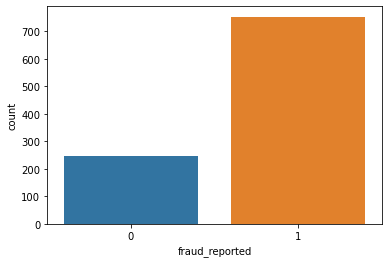

In [77]:
sns.countplot(x='fraud_reported',data=df)

imbalanced dataset

In [78]:
df_num1=df[["policy_number", "policy_deductable", "umbrella_limit", "insured_zip", "capital-gains", "capital-loss", "number_of_vehicles_involved", "bodily_injuries", "witnesses", "total_claim_amount", "injury_claim", "property_claim", "vehicle_claim", "auto_year", "fraud_reported" ]]

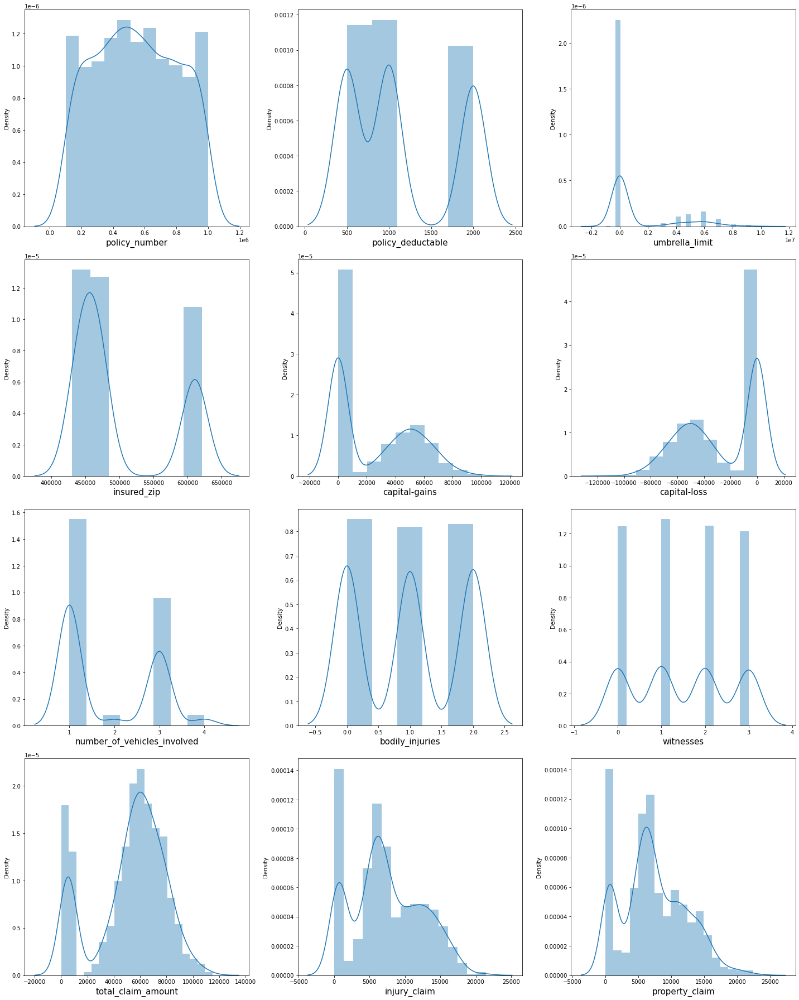

In [79]:
plt.figure(figsize = (20, 25))
plotnumber = 1

for col in df_num1:
    if plotnumber <= 12:
        ax = plt.subplot(4, 3, plotnumber)
        sns.distplot(df[col])
        plt.xlabel(col, fontsize = 15)
        
    plotnumber += 1
    
plt.tight_layout()
plt.show()

total_claim_amount, injury_claim, property_claim has slight skewness

In [80]:
df_num=df[['months_as_customer','age','policy_annual_premium','profit','vehicle_age','incident_hour_of_the_day','policy_number']]

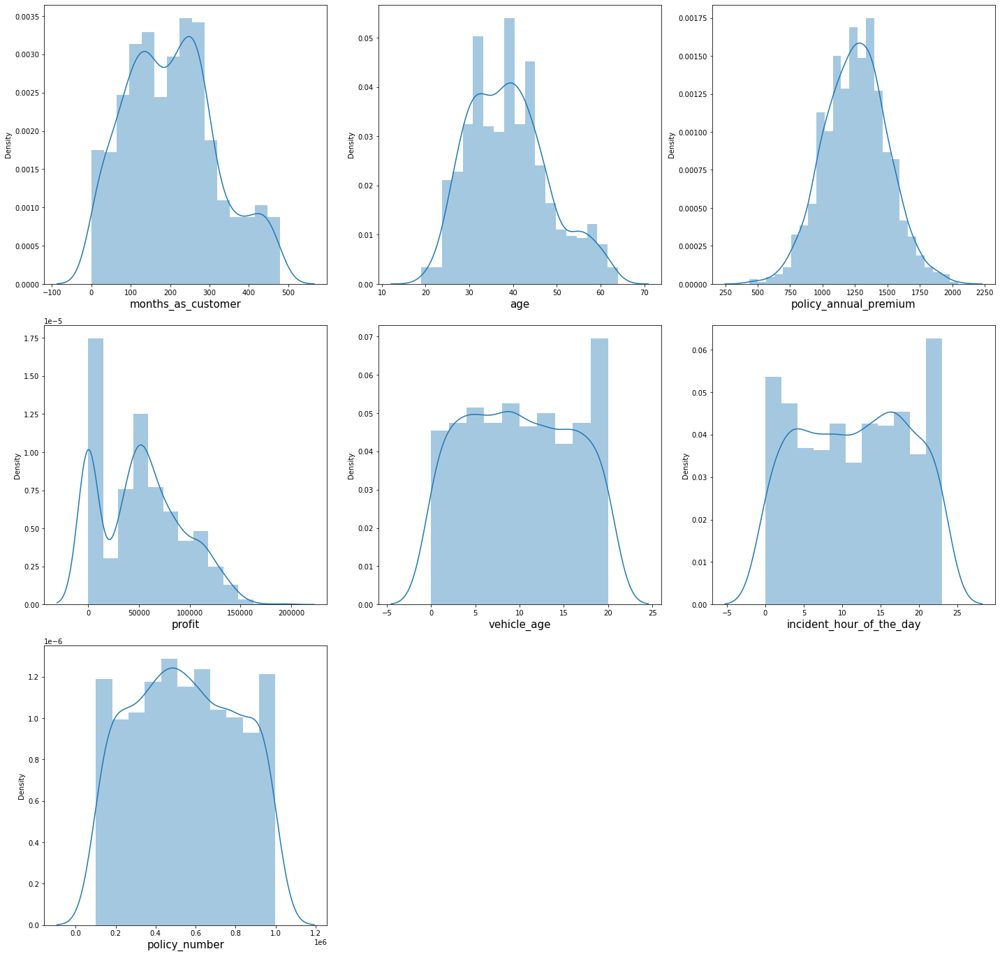

In [81]:
plt.figure(figsize = (20, 25))
plotnumber = 1

for col in df_num:
    if plotnumber <= 12:
        ax = plt.subplot(4, 3, plotnumber)
        sns.distplot(df[col])
        plt.xlabel(col, fontsize = 15)
        
    plotnumber += 1
    
plt.tight_layout()
plt.show()

months_as_customer','age','profit has slight skewness

In [82]:
df_cat1=df[['incident_city','incident_hour_of_the_day','number_of_vehicles_involved','property_damage', 'bodily_injuries','auto_make', 'auto_year','witnesses', 'police_report_available','incident_month',
            'vehicle_age']]

In [83]:
list(enumerate(df_cat1))

[(0, 'incident_city'),
 (1, 'incident_hour_of_the_day'),
 (2, 'number_of_vehicles_involved'),
 (3, 'property_damage'),
 (4, 'bodily_injuries'),
 (5, 'auto_make'),
 (6, 'auto_year'),
 (7, 'witnesses'),
 (8, 'police_report_available'),
 (9, 'incident_month'),
 (10, 'vehicle_age')]

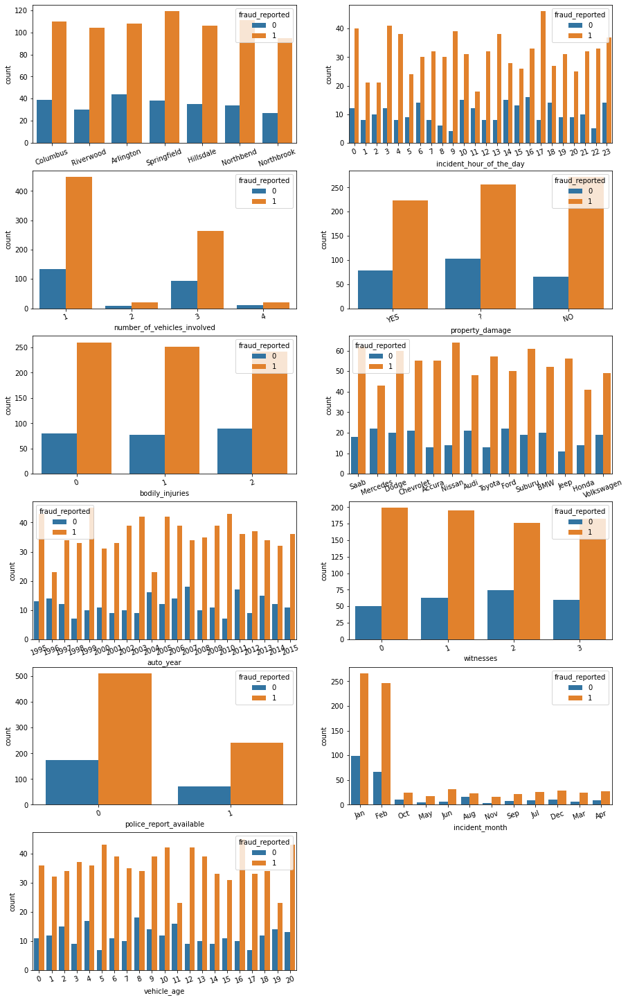

In [84]:
plt.figure(figsize=(15,30))
for i in enumerate(df_cat1):
    plt.subplot(7,2,i[0]+1)
    sns.countplot(i[1],hue="fraud_reported",data=df)
    plt.xticks(rotation=20)

springfield,17th hour,no property damage,jan and feb month,no police report available,1 vehicle involved,no witness,auto year 1999,no injury,accura has most fraud reported cases

In [85]:
df_cat = df[[ 'policy_state','policy_csl','policy_deductable','insured_sex',
       'insured_education_level',
       'insured_relationship', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state']]

In [86]:
list(enumerate(df_cat))

[(0, 'policy_state'),
 (1, 'policy_csl'),
 (2, 'policy_deductable'),
 (3, 'insured_sex'),
 (4, 'insured_education_level'),
 (5, 'insured_relationship'),
 (6, 'incident_type'),
 (7, 'collision_type'),
 (8, 'incident_severity'),
 (9, 'authorities_contacted'),
 (10, 'incident_state')]

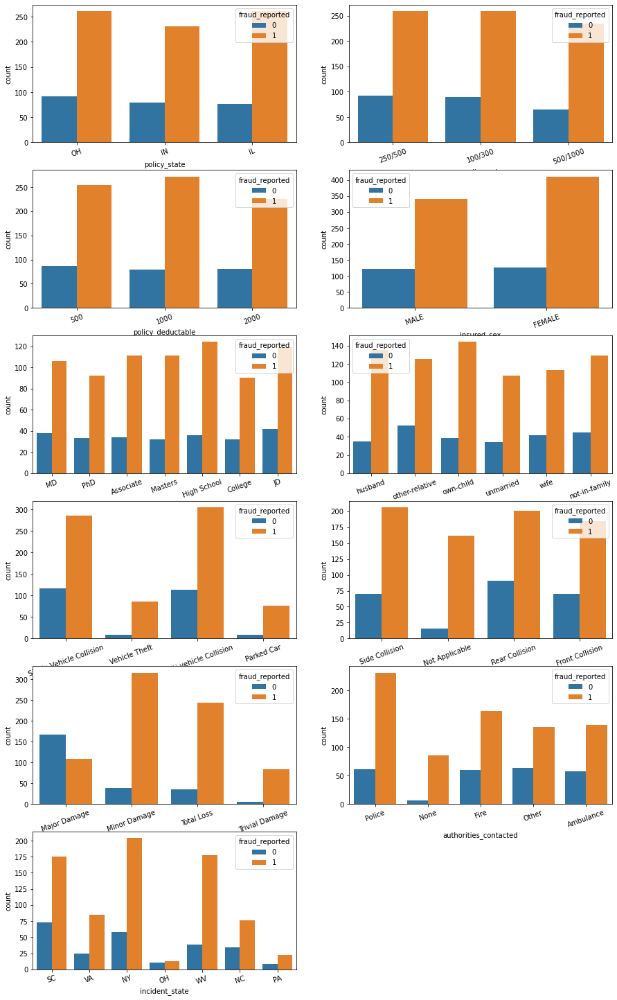

In [87]:
plt.figure(figsize=(15,30))
for i in enumerate(df_cat):
    plt.subplot(7,2,i[0]+1)
    sns.countplot(i[1],hue="fraud_reported",data=df)
    plt.xticks(rotation=20)

this graph shows the column value and their fraud reported cases

In [88]:
df_cat3=df[['insured_occupation','insured_hobbies','incident_city']]

In [89]:
list(enumerate(df_cat3))

[(0, 'insured_occupation'), (1, 'insured_hobbies'), (2, 'incident_city')]

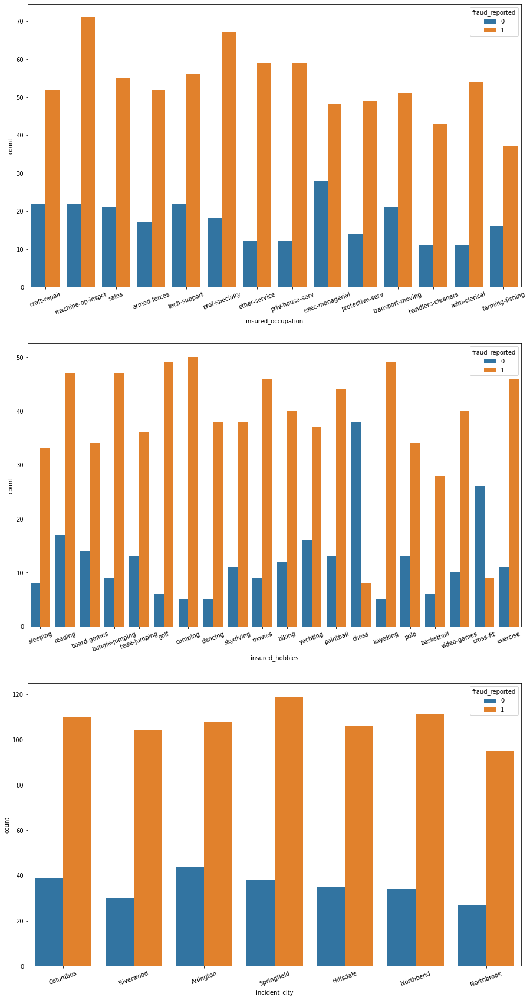

In [90]:
plt.figure(figsize=(15,30))
for i in enumerate(df_cat3):
    plt.subplot(3,1,i[0]+1)
    sns.countplot(i[1],hue="fraud_reported",data=df)
    plt.xticks(rotation=20)

this graph shows the column value and their fraud reported cases

<AxesSubplot:xlabel='property_damage', ylabel='property_claim'>

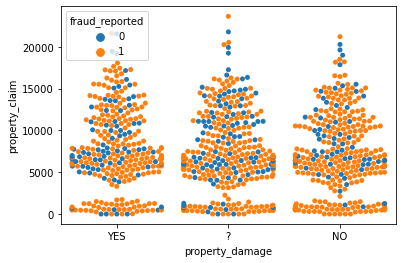

In [91]:
sns.swarmplot(x="property_damage", y="property_claim", hue="fraud_reported", data=df)

no property damage has high property claim due to highness in fraud reported

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, 'Saab'),
  Text(1, 0, 'Mercedes'),
  Text(2, 0, 'Dodge'),
  Text(3, 0, 'Chevrolet'),
  Text(4, 0, 'Accura'),
  Text(5, 0, 'Nissan'),
  Text(6, 0, 'Audi'),
  Text(7, 0, 'Toyota'),
  Text(8, 0, 'Ford'),
  Text(9, 0, 'Suburu'),
  Text(10, 0, 'BMW'),
  Text(11, 0, 'Jeep'),
  Text(12, 0, 'Honda'),
  Text(13, 0, 'Volkswagen')])

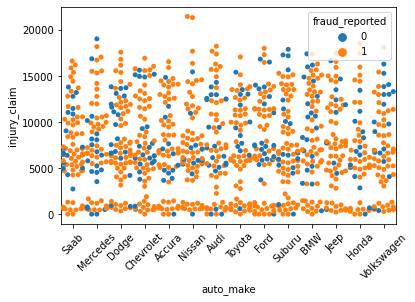

In [92]:
sns.swarmplot(x="auto_make", y="injury_claim", hue="fraud_reported", data=df)
plt.xticks(rotation=45)

nissan and jeep maker has high fraud reported

(array([0, 1]), [Text(0, 0, '0'), Text(1, 0, '1')])

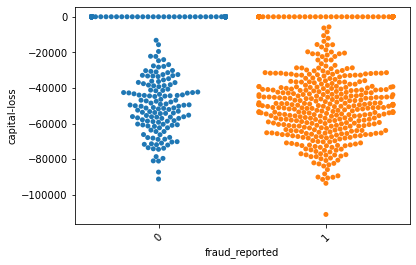

In [93]:
sns.swarmplot(x="fraud_reported", y="capital-loss", data=df)
plt.xticks(rotation=45)

if fraud reported increases then capital loss will also increase

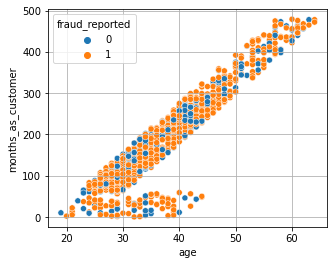

In [94]:
plt.figure(figsize=(5,4))
sns.scatterplot(x='age',y='months_as_customer',hue='fraud_reported',data=df)
plt.grid(True)
plt.show()

most customers are around age of below 50 and if age increases then months as customer to insurance company also increases

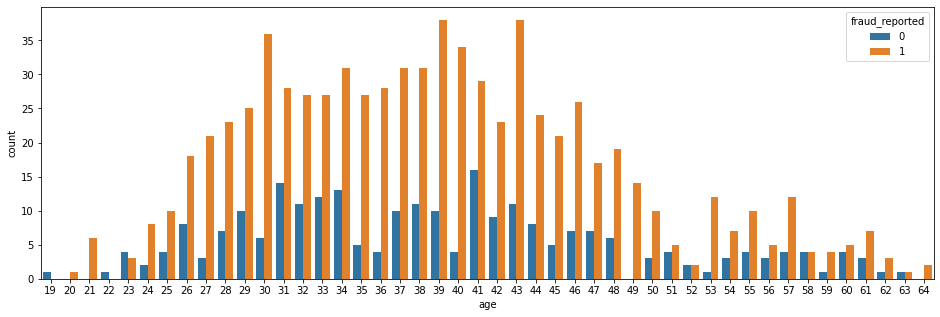

In [95]:
plt.figure(figsize=(16,5))
sns.countplot(x=df['age'],hue='fraud_reported',data=df)
#plt.xticks(rotation=20)
plt.show()


fraud reported are high in age range of 28  to 47.fraud reported of age group is higher than other fraud not reported

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

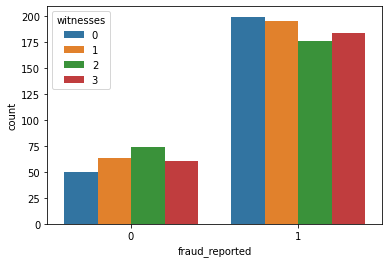

In [96]:
sns.countplot(x=df['fraud_reported'],hue='witnesses',data=df)

witness of all groups is high for fraud reported

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

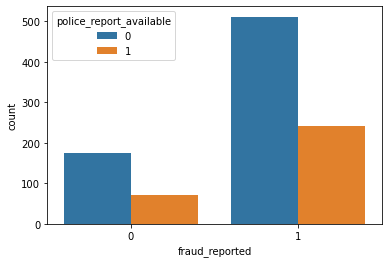

In [97]:
sns.countplot(x=df['fraud_reported'],hue='police_report_available',data=df)

police report available for fraud reported is high

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

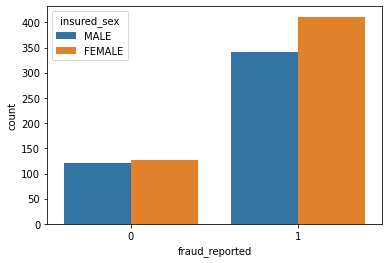

In [98]:
sns.countplot(x=df['fraud_reported'],hue='insured_sex',data=df)

fraud reported is high than not reported irrespective of gender

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

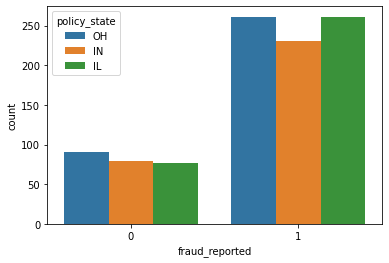

In [99]:
sns.countplot(x=df['fraud_reported'],hue=df['policy_state'],data=df)

fraud reported is high for all policy states

(array([0, 1, 2, 3]),
 [Text(0, 0, 'Single Vehicle Collision'),
  Text(1, 0, 'Vehicle Theft'),
  Text(2, 0, 'Multi-vehicle Collision'),
  Text(3, 0, 'Parked Car')])

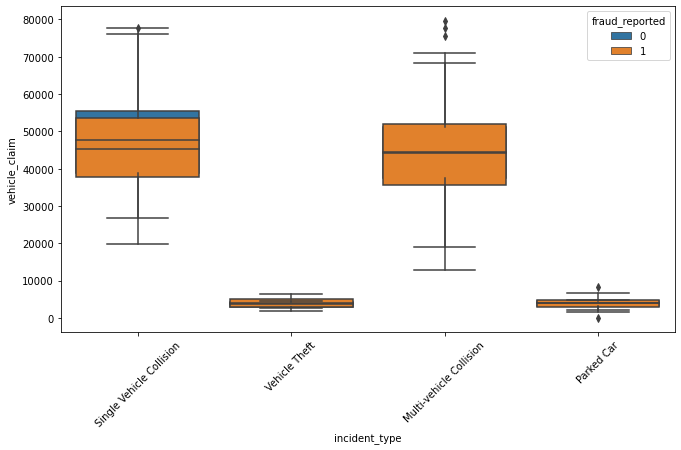

In [100]:
plt.figure(figsize=(11,6))
sns.boxplot(x="incident_type", y="vehicle_claim", hue="fraud_reported", data=df, dodge=False)
plt.xticks(rotation=45)

vehicle claim is high for single vehicle collision

<AxesSubplot:xlabel='policy_state', ylabel='total_claim_amount'>

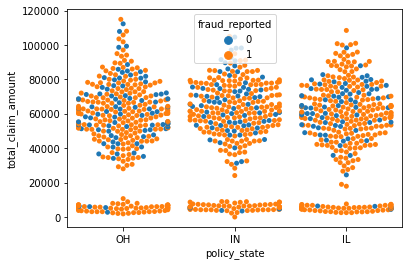

In [101]:
sns.swarmplot(x="policy_state", y="total_claim_amount", hue="fraud_reported", data=df)

total claim amount is high for policy state IL

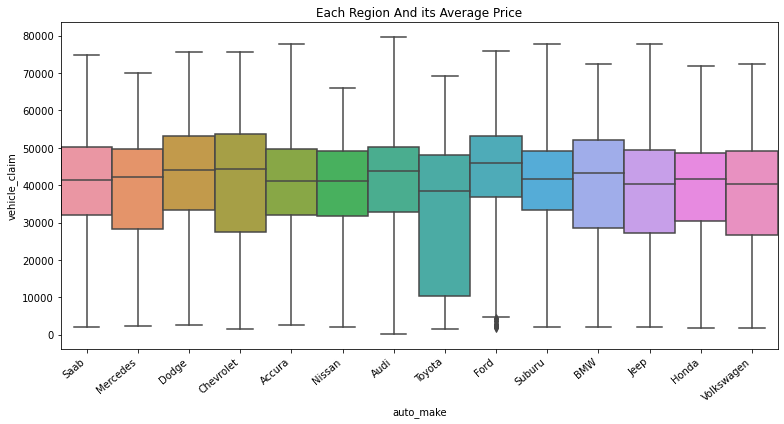

In [102]:
plt.figure(figsize = (11, 6))
plt.title("Each Region And its Average Price")
ax=sns.boxplot(x='auto_make',y='vehicle_claim',data=df1,width=1,whis=2)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

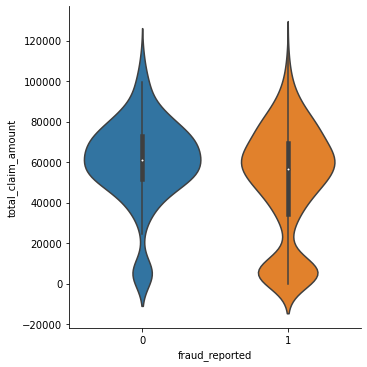

In [103]:
sns.catplot(x="fraud_reported", y="total_claim_amount", kind="violin",data=df);

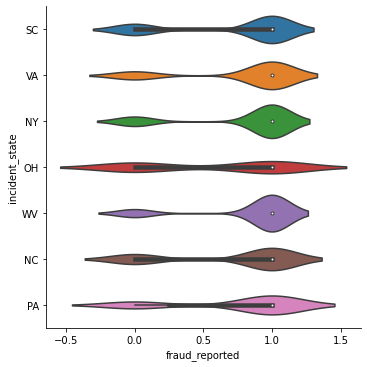

In [104]:
sns.catplot(x="fraud_reported", y="incident_state", kind="violin",data=df);

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, 'Saab'),
  Text(1, 0, 'Mercedes'),
  Text(2, 0, 'Dodge'),
  Text(3, 0, 'Chevrolet'),
  Text(4, 0, 'Accura'),
  Text(5, 0, 'Nissan'),
  Text(6, 0, 'Audi'),
  Text(7, 0, 'Toyota'),
  Text(8, 0, 'Ford'),
  Text(9, 0, 'Suburu'),
  Text(10, 0, 'BMW'),
  Text(11, 0, 'Jeep'),
  Text(12, 0, 'Honda'),
  Text(13, 0, 'Volkswagen')])

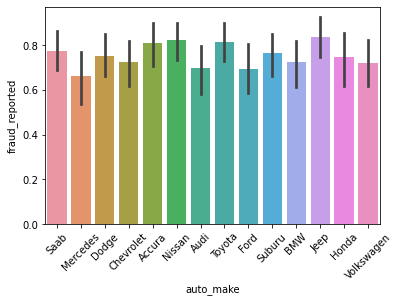

In [105]:
sns.barplot(x="auto_make", y="fraud_reported", data=df)
plt.xticks(rotation=45)

Text(0.5, 1.0, 'Authorities_contacted')

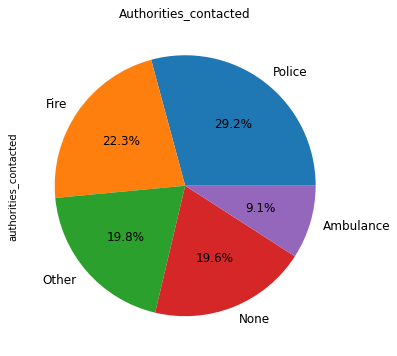

In [106]:
fig = plt.figure(figsize=(10,6))
ax = (df['authorities_contacted'].value_counts()*100.0 /len(df))\
.plot.pie(autopct='%.1f%%', labels = ['Police', 'Fire', 'Other', 'None', 'Ambulance'],
         fontsize=12)
plt.title('Authorities_contacted')

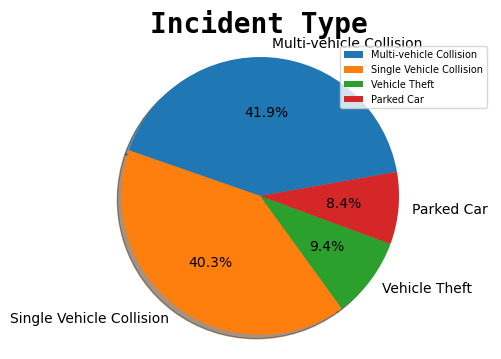

In [107]:
# Creating a pie chart 
ax = df['incident_type'].value_counts()

plt.style.use('default')
plt.figure(figsize=(6, 4))
plt.pie(ax.values, labels=ax.index, startangle=10, explode=(None), shadow=True, autopct='%1.1f%%')
plt.title('Incident Type', fontdict={
          'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.legend()
plt.legend(prop={'size': 7})
plt.axis('equal')
plt.show()

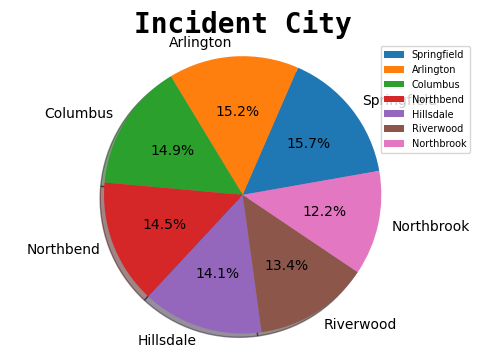

In [108]:
# Creating a pie chart 
ax= df['incident_city'].value_counts()

plt.style.use('default')
plt.figure(figsize=(6, 4))
plt.pie(ax.values, labels=ax.index, startangle=10, explode=(None), shadow=True, autopct='%1.1f%%')
plt.title('Incident City', fontdict={
          'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.legend()
plt.legend(prop={'size': 7})
plt.axis('equal')
plt.show()

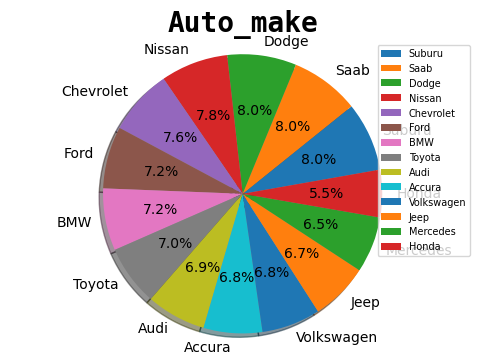

In [109]:
# Creating a pie chart 
ax = df['auto_make'].value_counts()

plt.style.use('default')
plt.figure(figsize=(6, 4))
plt.pie(ax.values, labels=ax.index, startangle=10, explode=(None), shadow=True, autopct='%1.1f%%')
plt.title('Auto_make', fontdict={
          'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.legend()
plt.legend(prop={'size': 7})
plt.axis('equal')
plt.show()

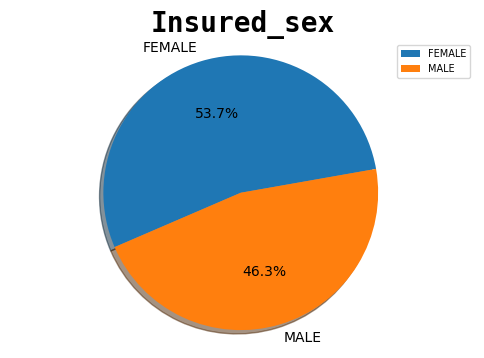

In [110]:
# Creating a pie chart 
ax = df['insured_sex'].value_counts()

plt.style.use('default')
plt.figure(figsize=(6, 4))
plt.pie(ax.values, labels=ax.index, startangle=10, explode=(None), shadow=True, autopct='%1.1f%%')
plt.title('Insured_sex', fontdict={
          'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.legend()
plt.legend(prop={'size': 7})
plt.axis('equal')
plt.show()

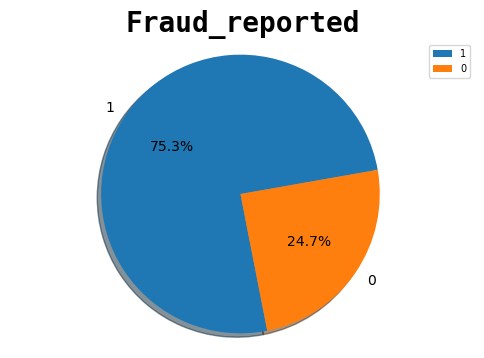

In [111]:
# Creating a pie chart 
ax = df['fraud_reported'].value_counts()

plt.style.use('default')
plt.figure(figsize=(6, 4))
plt.pie(ax.values, labels=ax.index, startangle=10, explode=(None), shadow=True, autopct='%1.1f%%')
plt.title('Fraud_reported', fontdict={
          'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.legend()
plt.legend(prop={'size': 7})
plt.axis('equal')
plt.show()

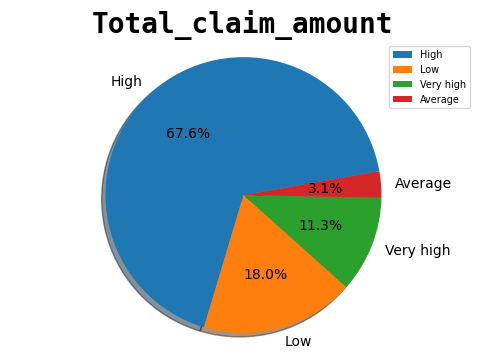

In [112]:
# Creating a pie chart 
ax = df['total_claim_amount_groups'].value_counts()

plt.style.use('default')
plt.figure(figsize=(6, 4))
plt.pie(ax.values, labels=ax.index, startangle=10, explode=(None), shadow=True, autopct='%1.1f%%')
plt.title('Total_claim_amount', fontdict={
          'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.legend()
plt.legend(prop={'size': 7})
plt.axis('equal')
plt.show()

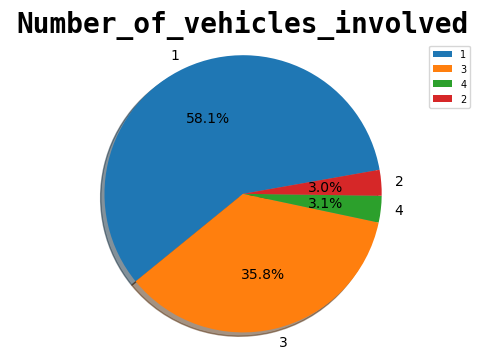

In [113]:
# Creating a pie chart 
ax = df['number_of_vehicles_involved'].value_counts()

plt.style.use('default')
plt.figure(figsize=(6, 4))
plt.pie(ax.values, labels=ax.index, startangle=10, explode=(None), shadow=True, autopct='%1.1f%%')
plt.title('Number_of_vehicles_involved', fontdict={
          'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.legend()
plt.legend(prop={'size': 7})
plt.axis('equal')
plt.show()

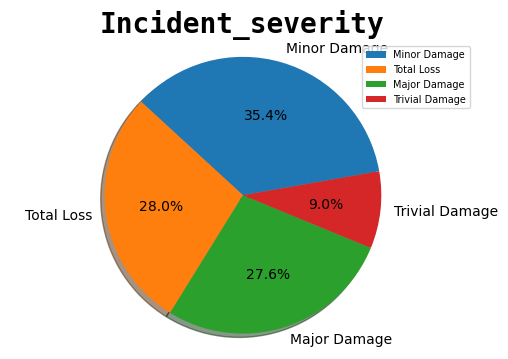

In [114]:
# Creating a pie chart 
ax = df['incident_severity'].value_counts()

plt.style.use('default')
plt.figure(figsize=(6, 4))
plt.pie(ax.values, labels=ax.index, startangle=10, explode=(None), shadow=True, autopct='%1.1f%%')
plt.title('Incident_severity', fontdict={
          'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.legend()
plt.legend(prop={'size': 7})
plt.axis('equal')
plt.show()

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

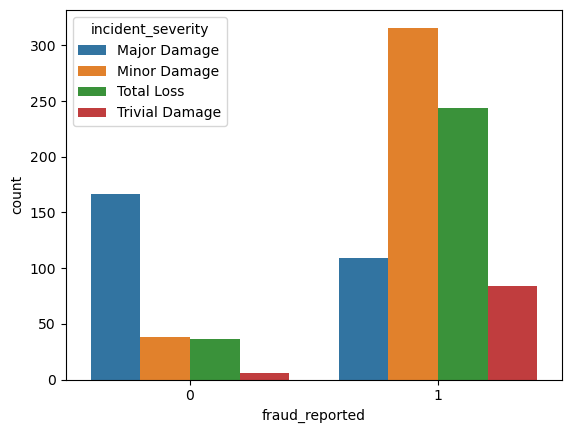

In [115]:
sns.countplot(x=df['fraud_reported'],hue='incident_severity',data=df)

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

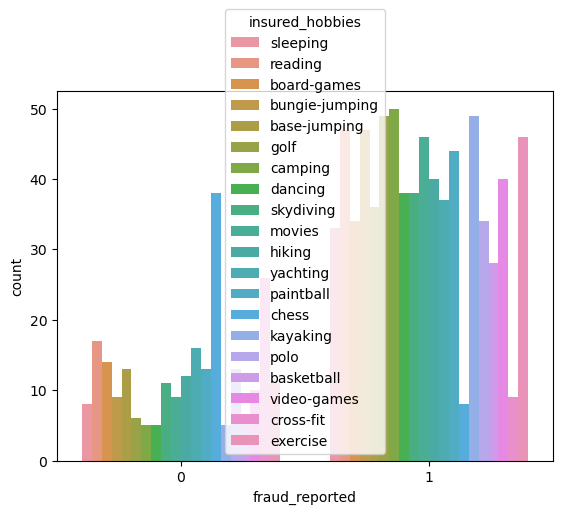

In [116]:

sns.countplot(x=df['fraud_reported'],hue='insured_hobbies',data=df)

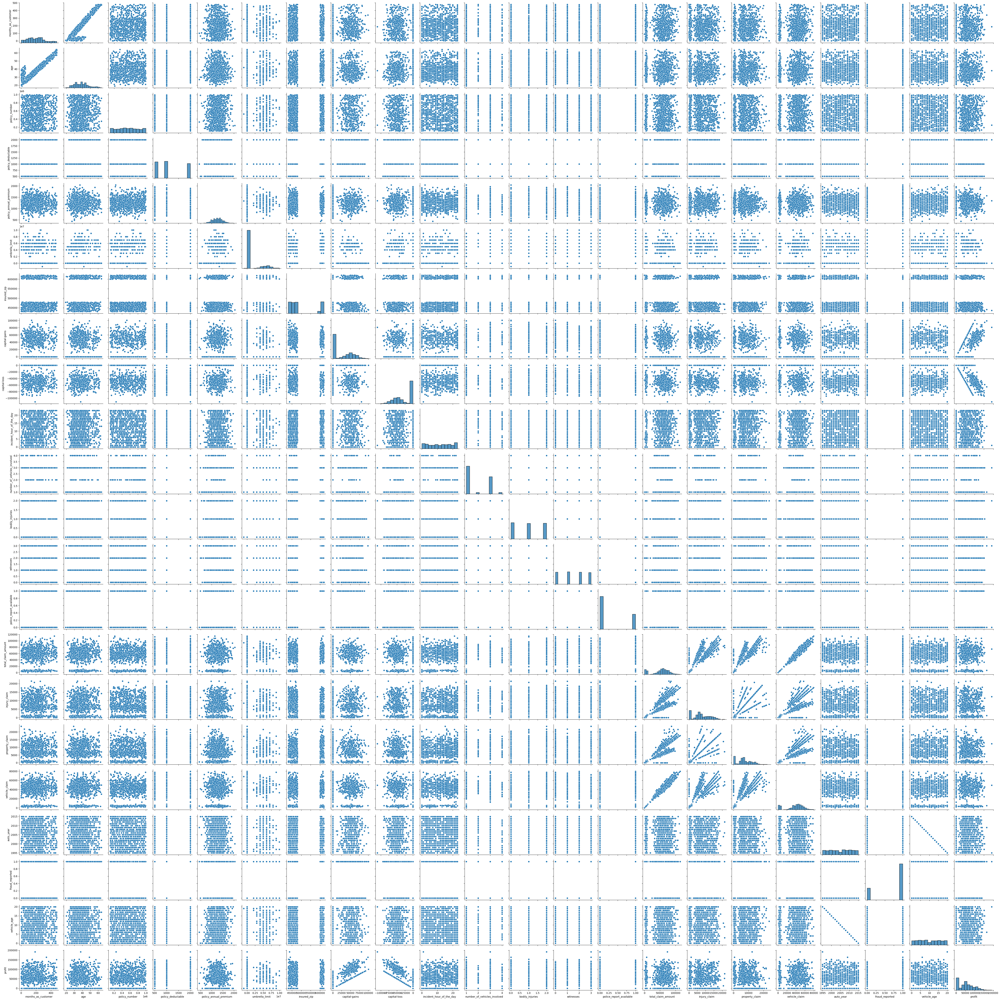

In [117]:
sns.pairplot(df)
plt.show()

Text(0.5, 1.0, 'Fraud_reported vs Total_claim_amount----Fradulent vs Not Fradulent')

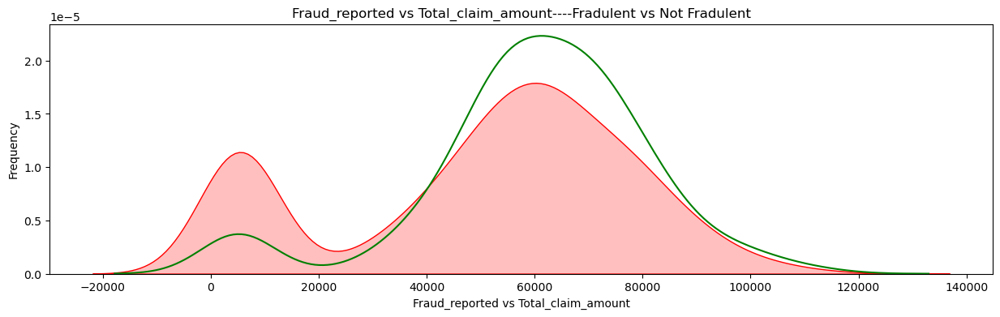

In [118]:
fig=plt.figure(figsize=(15,4))
ax=sns.kdeplot(df.loc[(df['fraud_reported']==0),'total_claim_amount'],color='g',shade=False,label='No')
ax=sns.kdeplot(df.loc[(df['fraud_reported']==1),'total_claim_amount'],color='r',shade=True,label=' Yes')
ax.set(xlabel='Fraud_reported vs Total_claim_amount',ylabel='Frequency')
plt.title('Fraud_reported vs Total_claim_amount----Fradulent vs Not Fradulent')

No fraud reported is high for in total claim amounts.But in overall fraud reported is only high

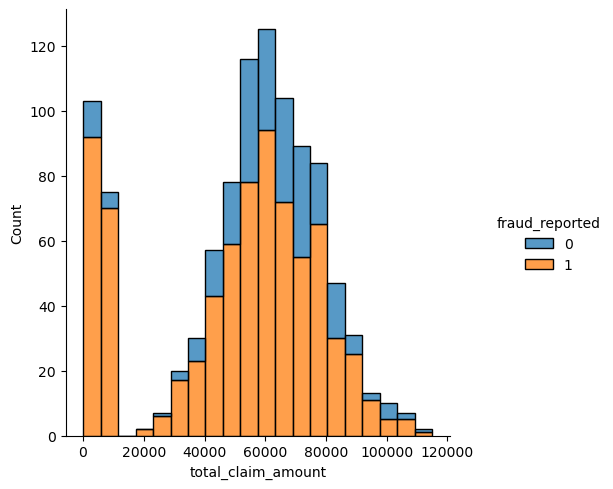

In [119]:
sns.displot(df, x="total_claim_amount", hue="fraud_reported", multiple="stack")

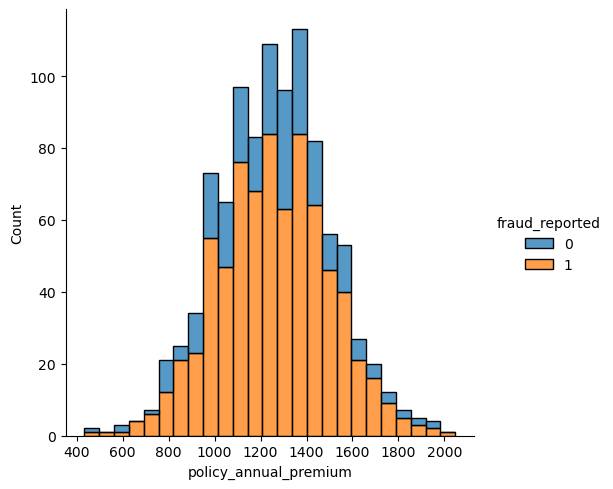

In [120]:
sns.displot(df, x="policy_annual_premium", hue="fraud_reported", multiple="stack")

No fraud reported is high for policy annual premium.

Text(0, 0.5, 'total_claim_amount')

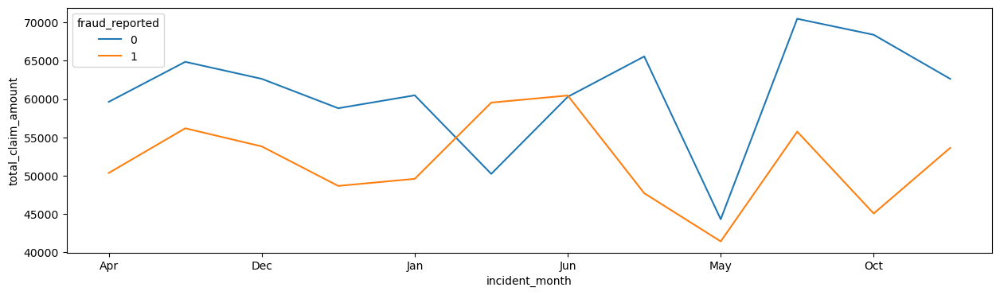

In [121]:
month_category=df.pivot_table(index='incident_month', columns='fraud_reported', aggfunc='mean')['total_claim_amount']
month_category.plot(figsize=(15,4))
plt.ylabel('total_claim_amount')

it seems fraud reported is high in octobers

DATA PRE-PROCESSING And FEATURE ENGINEERING

In [122]:
df1=df

In [123]:
df1

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,incident_month,vehicle_age,profit,total_claim_amount_groups
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,13020,52080,Saab,92x,2004,0,Jan,11,53300,High
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,780,3510,Mercedes,E400,2007,0,Jan,8,0,Low
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3850,23100,Dodge,RAM,2007,1,Feb,8,35100,Average
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,6340,50720,Chevrolet,Tahoe,2014,0,Oct,1,111300,High
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,650,4550,Accura,RSX,2009,1,Feb,6,112000,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,8720,61040,Honda,Accord,2006,1,Feb,9,0,Very high
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,18080,72320,Volkswagen,Passat,2015,1,Jan,0,70900,Very high
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,7500,52500,Suburu,Impreza,1996,1,Jan,19,35100,High
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,5220,36540,Audi,A5,1998,1,Feb,17,0,High


drop column because high none values

In [124]:
df1=df1.drop(['umbrella_limit','capital-gains', 'capital-loss','property_damage'],axis=1)

drop columns becoz it created only for analysis purpose

In [125]:
df1=df1.drop(['incident_month', 'vehicle_age', 'profit', 'total_claim_amount_groups'],axis=1)

total claim amount is sum of all the claims so we can drop other columns

In [126]:
df1=df1.drop(['injury_claim','property_claim','vehicle_claim'],axis=1)

In [127]:
df1

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_zip,insured_sex,...,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,police_report_available,total_claim_amount,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,466132,MALE,...,5,1,1,2,1,71610,Saab,92x,2004,0
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,468176,MALE,...,8,1,0,0,0,5070,Mercedes,E400,2007,0
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,430632,FEMALE,...,7,3,2,3,0,34650,Dodge,RAM,2007,1
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,608117,FEMALE,...,5,1,1,2,0,63400,Chevrolet,Tahoe,2014,0
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,610706,MALE,...,20,1,0,1,0,6500,Accura,RSX,2009,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,431289,FEMALE,...,20,1,0,1,0,87200,Honda,Accord,2006,1
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,608177,FEMALE,...,23,1,2,3,0,108480,Volkswagen,Passat,2015,1
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,442797,FEMALE,...,4,3,2,3,1,67500,Suburu,Impreza,1996,1
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,441714,MALE,...,2,1,0,1,1,46980,Audi,A5,1998,1


In [128]:
#converting string data type to int type using LabelEncoding
le=LabelEncoder()

list1=['policy_bind_date','policy_state','insured_sex','insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship','incident_date','incident_type','collision_type', 'incident_severity', 'authorities_contacted',
       'incident_state', 'incident_city', 'incident_location','police_report_available','auto_make', 'auto_model','policy_csl']

for val in list1:
    df1[val]=le.fit_transform(df1[val].astype(str))
df1

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_zip,insured_sex,...,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,police_report_available,total_claim_amount,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,532,2,1,1000,1406.91,466132,1,...,5,1,1,2,1,71610,10,1,2004,0
1,228,42,342868,821,1,1,2000,1197.22,468176,1,...,8,1,0,0,0,5070,8,12,2007,0
2,134,29,687698,186,2,0,2000,1413.14,430632,0,...,7,3,2,3,0,34650,4,30,2007,1
3,256,41,227811,766,0,1,2000,1415.74,608117,0,...,5,1,1,2,0,63400,3,34,2014,0
4,228,44,367455,181,0,2,1000,1583.91,610706,1,...,20,1,0,1,0,6500,0,31,2009,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,487,2,2,1000,1310.80,431289,0,...,20,1,0,1,0,87200,6,6,2006,1
996,285,41,186934,129,0,0,1000,1436.79,608177,0,...,23,1,2,3,0,108480,13,28,2015,1
997,130,34,918516,509,2,1,500,1383.49,442797,0,...,4,3,2,3,1,67500,11,19,1996,1
998,458,62,533940,573,0,2,2000,1356.92,441714,1,...,2,1,0,1,1,46980,1,5,1998,1


In [129]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 32 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   int32  
 4   policy_state                 1000 non-null   int32  
 5   policy_csl                   1000 non-null   int32  
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   insured_zip                  1000 non-null   int64  
 9   insured_sex                  1000 non-null   int32  
 10  insured_education_level      1000 non-null   int32  
 11  insured_occupation           1000 non-null   int32  
 12  insured_hobbies              1000 non-null   int32  
 13  insured_relationshi

In [130]:
#find correlation co.efficient of all variables in table
df1.corr()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_zip,insured_sex,...,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,police_report_available,total_claim_amount,auto_make,auto_model,auto_year,fraud_reported
months_as_customer,1.000000,0.922098,0.057555,0.055055,-0.000328,-0.026819,0.026807,0.005018,0.017895,0.060925,...,0.070639,0.014736,-0.010162,0.058383,-0.022146,0.062108,0.047655,0.004202,-0.000292,-0.020544
age,0.922098,1.000000,0.059413,0.056538,-0.014533,-0.015185,0.029188,0.014404,0.025604,0.073337,...,0.087161,0.022102,-0.015679,0.052359,-0.020441,0.069863,0.030410,0.017343,0.001354,-0.012143
policy_number,0.057555,0.059413,1.000000,0.045713,0.072815,0.038917,-0.006738,0.022566,0.007083,0.004564,...,0.000113,0.013432,-0.004558,-0.012661,0.031190,-0.018009,0.023860,0.065240,-0.000183,0.029443
policy_bind_date,0.055055,0.056538,0.045713,1.000000,0.015289,0.008486,-0.001721,-0.037733,-0.042749,0.039338,...,-0.012582,-0.002381,-0.046970,-0.007004,-0.011563,0.015901,-0.025955,0.000306,0.035067,-0.060642
policy_state,-0.000328,-0.014533,0.072815,0.015289,1.000000,0.001027,0.010033,0.012455,0.008777,-0.020481,...,0.029457,-0.042263,0.013384,0.022960,0.069017,-0.006002,0.017124,-0.025253,0.002114,-0.029432
policy_csl,-0.026819,-0.015185,0.038917,0.008486,0.001027,1.000000,0.003384,0.023978,0.006879,-0.010757,...,-0.001869,-0.019403,-0.000595,0.071500,-0.001645,-0.055758,-0.004701,0.047885,-0.033082,0.037190
policy_deductable,0.026807,0.029188,-0.006738,-0.001721,0.010033,0.003384,1.000000,-0.003245,0.004545,-0.009733,...,0.060935,0.051214,-0.022765,0.066639,0.038036,0.022839,-0.035379,-0.003268,0.026105,-0.014817
policy_annual_premium,0.005018,0.014404,0.022566,-0.037733,0.012455,0.023978,-0.003245,1.000000,0.032354,0.038853,...,-0.001578,-0.045991,0.026780,0.002332,0.021998,0.009094,0.000045,-0.031849,-0.049226,0.014480
insured_zip,0.017895,0.025604,0.007083,-0.042749,0.008777,0.006879,0.004545,0.032354,1.000000,-0.036942,...,0.008274,0.027448,0.028695,0.019805,0.009841,-0.033873,-0.020892,0.023637,-0.032736,-0.019368
insured_sex,0.060925,0.073337,0.004564,0.039338,-0.020481,-0.010757,-0.009733,0.038853,-0.036942,1.000000,...,0.019290,0.018793,-0.020297,0.042463,0.006992,-0.023727,0.026457,-0.018421,-0.028247,-0.030873


auto make and incident of the day columns are nearly having zero correlation with target column.it can be seen from describe method and heatmap

<AxesSubplot:>

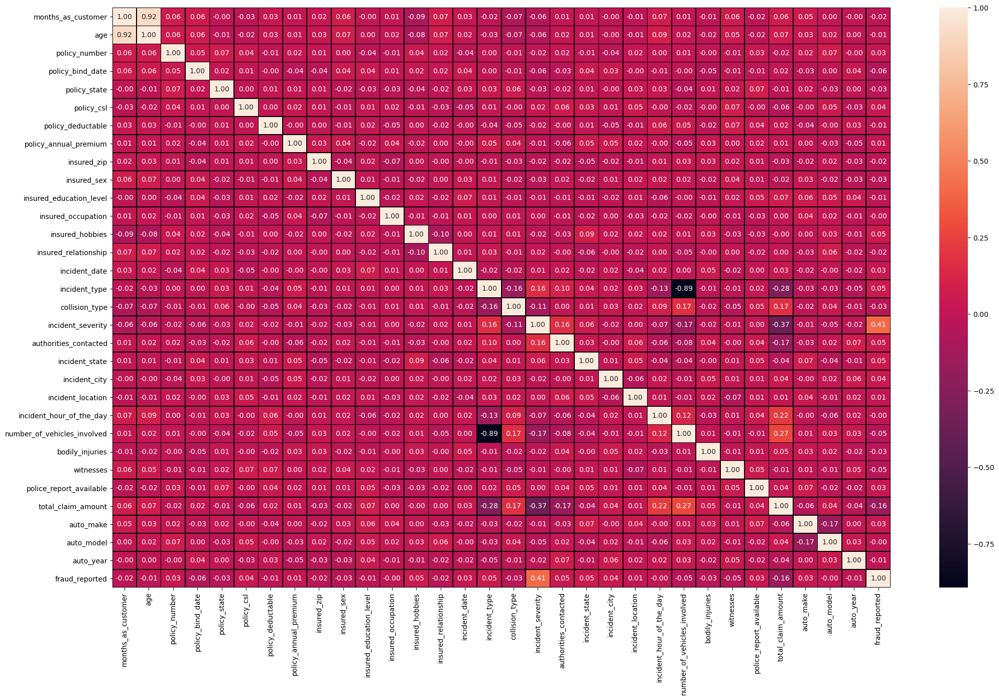

In [131]:
plt.figure(figsize=(25,15))
sns.heatmap(df1.corr(),annot=True,linewidths=0.5,linecolor="black",fmt='.2f')

incident severity is the most correlated and total claim amount is the least correlated with the target column.insured occupation has zero correlation with the target column.age and auto year has multicollinearity

In [132]:
df1.describe()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_zip,insured_sex,...,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,police_report_available,total_claim_amount,auto_make,auto_model,auto_year,fraud_reported
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,...,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,546238.648000,474.332000,1.01400,0.951000,1136.000000,1256.406150,501214.488000,0.463000,...,11.644000,1.83900,0.992000,1.487000,0.314000,52761.94000,6.546000,19.318000,2005.103000,0.753000
std,115.113174,9.140287,257063.005276,275.402851,0.83096,0.804516,611.864673,244.167395,71701.610941,0.498879,...,6.951373,1.01888,0.820127,1.111335,0.464349,26401.53319,4.034869,11.136107,6.015861,0.431483
min,0.000000,19.000000,100804.000000,0.000000,0.00000,0.000000,500.000000,433.330000,430104.000000,0.000000,...,0.000000,1.00000,0.000000,0.000000,0.000000,100.00000,0.000000,0.000000,1995.000000,0.000000
25%,115.750000,32.000000,335980.250000,233.750000,0.00000,0.000000,500.000000,1089.607500,448404.500000,0.000000,...,6.000000,1.00000,0.000000,1.000000,0.000000,41812.50000,3.000000,10.000000,2000.000000,1.000000
50%,199.500000,38.000000,533135.000000,472.500000,1.00000,1.000000,1000.000000,1257.200000,466445.500000,0.000000,...,12.000000,1.00000,1.000000,1.000000,0.000000,58055.00000,7.000000,20.000000,2005.000000,1.000000
75%,276.250000,44.000000,759099.750000,713.250000,2.00000,2.000000,2000.000000,1415.695000,603251.000000,1.000000,...,17.000000,3.00000,2.000000,2.000000,1.000000,70592.50000,10.000000,29.000000,2010.000000,1.000000
max,479.000000,64.000000,999435.000000,950.000000,2.00000,2.000000,2000.000000,2047.590000,620962.000000,1.000000,...,23.000000,4.00000,2.000000,3.000000,1.000000,114920.00000,13.000000,38.000000,2015.000000,1.000000



there is so much of gap between the 75% and the max.there are outliers and skewness.
the mean and std dev is not also much close to 0

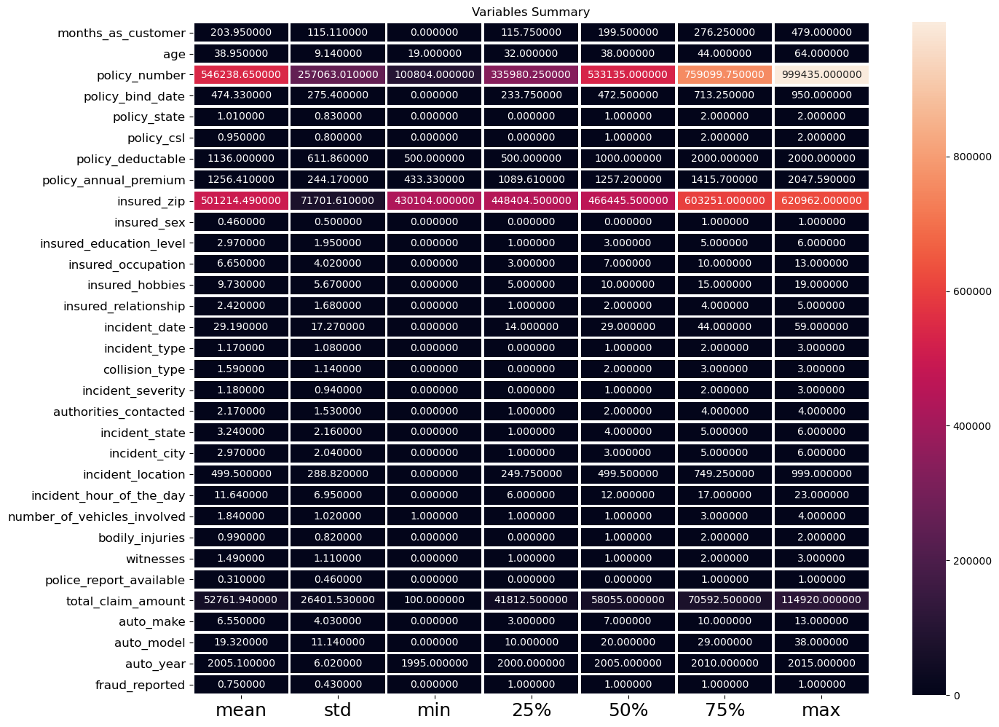

In [133]:
plt.figure(figsize=(15,12))
sns.heatmap(round(df1.describe()[1:].transpose(),2),linewidth=2,annot=True,fmt="f")
plt.xticks(fontsize=18)
plt.yticks(fontsize=12)
plt.title("Variables Summary")
plt.show()

In [134]:
#VIF calculation
import statsmodels.api as sm
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [135]:
df1.shape

(1000, 32)

In [136]:
df1.shape[1]

32

In [137]:
#calculates vif
def calc_vif(df1):
    vif=pd.DataFrame()
    vif['Variables']=df1.columns
    vif['VIF FACTOR']=[variance_inflation_factor(df1.values,i)for i in range(df1.shape[1])]
    return(vif)


calc_vif(df1)

,Variables,VIF FACTOR
0,months_as_customer,27.997594
1,age,130.143756
2,policy_number,5.696706
3,policy_bind_date,4.085700
4,policy_state,2.563062
5,policy_csl,2.460925
6,policy_deductable,4.559645
7,policy_annual_premium,28.195000
8,insured_zip,50.963306
9,insured_sex,1.909139


In [138]:
df1=df1.drop(['auto_year'],axis=1)

In [139]:
calc_vif(df1)

,Variables,VIF FACTOR
0,months_as_customer,24.259443
1,age,106.183906
2,policy_number,5.648263
3,policy_bind_date,4.007068
4,policy_state,2.539315
5,policy_csl,2.455806
6,policy_deductable,4.493031
7,policy_annual_premium,25.565422
8,insured_zip,39.735247
9,insured_sex,1.908536


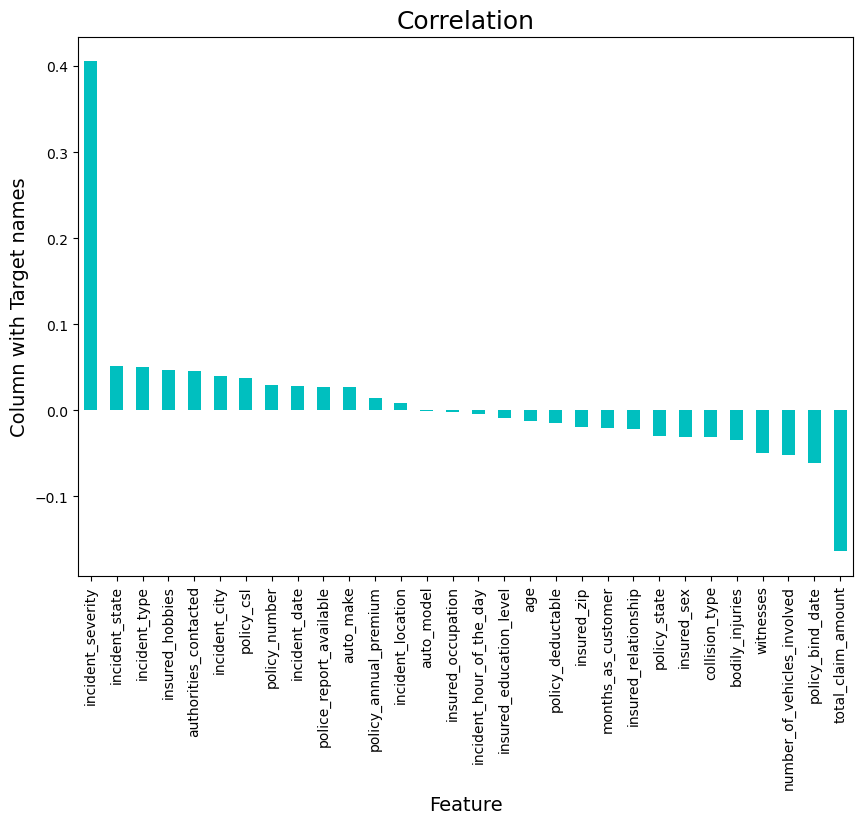

In [140]:
plt.figure(figsize=(10,7))
df1.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Column with Target names',fontsize=14)
plt.title('Correlation',fontsize=18)
plt.show()

this graph shows the positive and negative correlation of each variables with target column

In [141]:
df1=df1.drop(['auto_model'],axis=1)

In [142]:
calc_vif(df1)

,Variables,VIF FACTOR
0,months_as_customer,24.155954
1,age,105.447608
2,policy_number,5.611570
3,policy_bind_date,4.007053
4,policy_state,2.539111
5,policy_csl,2.448563
6,policy_deductable,4.492357
7,policy_annual_premium,25.565334
8,insured_zip,39.461472
9,insured_sex,1.908397


In [143]:
df1=df1.drop(['insured_occupation'],axis=1)

In [144]:
calc_vif(df1)

,Variables,VIF FACTOR
0,months_as_customer,24.008988
1,age,104.413367
2,policy_number,5.611569
3,policy_bind_date,4.003797
4,policy_state,2.538452
5,policy_csl,2.446634
6,policy_deductable,4.489727
7,policy_annual_premium,25.363891
8,insured_zip,39.461471
9,insured_sex,1.908224


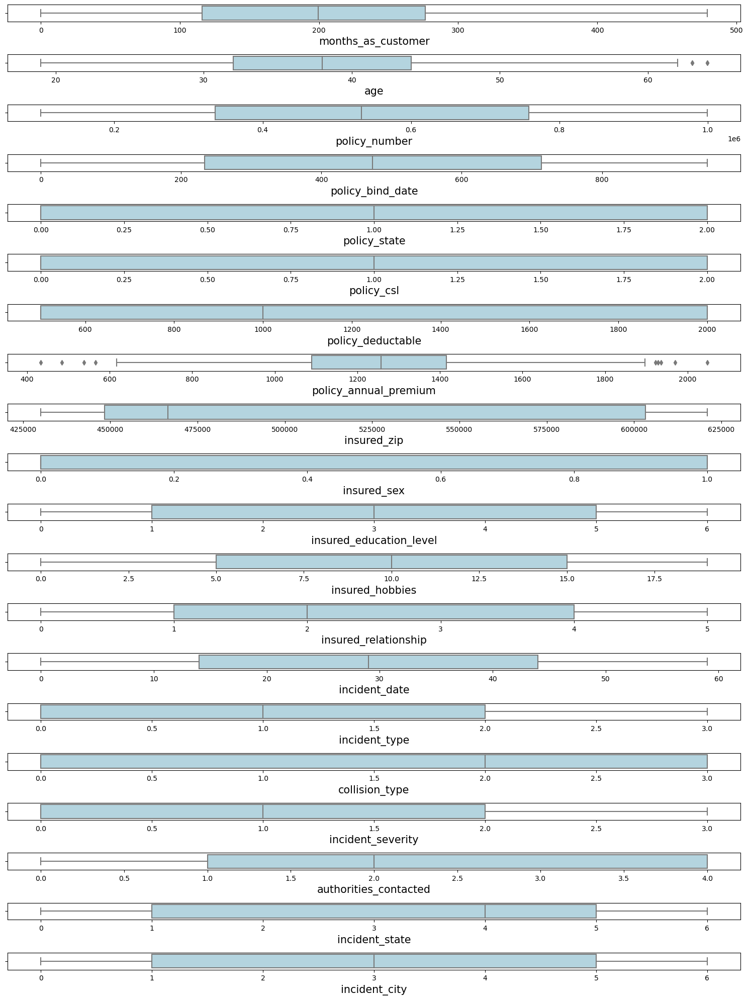

In [145]:
plt.figure(figsize= (15,20))
pltnum = 1
for i in df1:
    if pltnum <=20:
        plt.subplot(20,1,pltnum)
        sns.boxplot(df1[i],color = 'lightblue')
        plt.xlabel(i,fontsize=15)
    pltnum+=1
plt.tight_layout()

there are outliers present in columns

In [146]:
df1.skew()

months_as_customer             0.362177
age                            0.478988
policy_number                  0.038991
policy_bind_date               0.005194
policy_state                  -0.026177
policy_csl                     0.088928
policy_deductable              0.477887
policy_annual_premium          0.004402
insured_zip                    0.816554
insured_sex                    0.148630
insured_education_level       -0.000148
insured_hobbies               -0.061563
insured_relationship           0.077488
incident_date                  0.005157
incident_type                  0.101507
collision_type                -0.177814
incident_severity              0.279016
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
incident_location              0.000000
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
bodily_injuries                0.014777
witnesses                      0.019636


In [147]:
df1.shape

(1000, 29)

some skewness are present in the dataset

#checking Z-score to remove outliers

In [148]:
import numpy as np
from scipy.stats import zscore
z=np.abs(zscore(df1))
z.shape


(1000, 29)

In [149]:
threshold=3
print(np.where(z>3))

(array([229, 248, 763], dtype=int64), array([7, 7, 7], dtype=int64))


In [150]:
df_new=df1[(z<3).all(axis=1)]
print(df1.shape)
print(df_new.shape)

(1000, 29)
(997, 29)


some outliers got removed

In [151]:
#finds data loss
loss_percent=(1000-997)/(1000*100)
print(loss_percent)

3e-05


since data percentage loss is too low and its cleaned now

In [152]:
df_new


,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_zip,insured_sex,...,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,police_report_available,total_claim_amount,auto_make,fraud_reported
0,328,48,521585,532,2,1,1000,1406.91,466132,1,...,1,996,5,1,1,2,1,71610,10,0
1,228,42,342868,821,1,1,2000,1197.22,468176,1,...,5,628,8,1,0,0,0,5070,8,0
2,134,29,687698,186,2,0,2000,1413.14,430632,0,...,1,685,7,3,2,3,0,34650,4,1
3,256,41,227811,766,0,1,2000,1415.74,608117,0,...,0,669,5,1,1,2,0,63400,3,0
4,228,44,367455,181,0,2,1000,1583.91,610706,1,...,0,220,20,1,0,1,0,6500,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,487,2,2,1000,1310.80,431289,0,...,4,561,20,1,0,1,0,87200,6,1
996,285,41,186934,129,0,0,1000,1436.79,608177,0,...,3,227,23,1,2,3,0,108480,13,1
997,130,34,918516,509,2,1,500,1383.49,442797,0,...,0,746,4,3,2,3,1,67500,11,1
998,458,62,533940,573,0,2,2000,1356.92,441714,1,...,0,569,2,1,0,1,1,46980,1,1


In [153]:
df_new.shape

(997, 29)

In [154]:
#seggregate input data and output data
x=df_new.iloc[:,:-1]
y=df_new.iloc[:,-1]

In [155]:
print(f'Ratio of Fradulent:  {y.sum()/len(y)*100:.2f}%')

Ratio of Fradulent:  75.33%


SKEWNESS REMOVAL AND SCALING

In [156]:
#removing skewness
from sklearn.preprocessing import power_transform
x=power_transform(x,method='yeo-johnson')
x

array([[ 1.04885978,  1.00623646, -0.02468907, ...,  1.47827721,
         0.71596175,  0.86033788],
       [ 0.30143566,  0.4282794 , -0.7471209 , ..., -0.67646311,
        -1.77827873,  0.4193524 ],
       [-0.51426514, -1.14188879,  0.58749123, ..., -0.67646311,
        -0.7176964 , -0.55565739],
       ...,
       [-0.55271709, -0.47361245,  1.37517225, ...,  1.47827721,
         0.55311529,  1.07258581],
       [ 1.91169496,  2.13077027,  0.02250294, ...,  1.47827721,
        -0.24806641, -1.44268608],
       [ 1.89911511,  1.98548601,  0.10633725, ..., -0.67646311,
        -1.77860549,  0.4193524 ]])

In [157]:
#train test split
from sklearn.model_selection import train_test_split

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=40)

In [158]:
#importing module-------scaling
from sklearn.preprocessing import MinMaxScaler
# creating normalization object 
norm = MinMaxScaler()
# fit data
norm_fit = norm.fit(x_train)
new_xtrain = norm_fit.transform(x_train)
new_xtest = norm_fit.transform(x_test)
# display values
print(new_xtrain)
print(new_xtest)

[[0.65571055 0.64713097 0.61242523 ... 0.         0.62954656 0.74496156]
 [0.39391778 0.27894177 0.43967415 ... 0.         0.54663143 0.20954634]
 [0.29338213 0.30854738 0.71325165 ... 0.         0.0528994  0.74496156]
 ...
 [0.48893739 0.51662673 0.43349574 ... 1.         0.42293183 0.11219282]
 [0.69988948 0.64713097 0.5435725  ... 0.         0.49915679 0.20954634]
 [0.65916193 0.5841281  0.41748336 ... 1.         0.42487075 0.11219282]]
[[0.63128594 0.56215962 0.90658642 ... 0.         0.14503855 0.81095917]
 [0.59734715 0.60559787 0.23126821 ... 0.         0.50896702 0.53502348]
 [0.65916193 0.5841281  0.47172793 ... 0.         0.40937654 0.45990979]
 ...
 [0.67628321 0.64713097 0.36459809 ... 1.         0.01185286 0.29836333]
 [0.43104214 0.33723822 0.93449012 ... 0.         0.62348158 0.29836333]
 [0.64704136 0.64713097 0.70639756 ... 0.         0.53498152 0.45990979]]


In [159]:
##The classes are ordered and not balanced (e.g. there are many more normal wines than excellent or poor ones)
###so we are balancing the classes with smote technique

print("Before OverSampling, counts of label '1': {}".format(sum(y_train == 1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(y_train == 0)))

# import SMOTE module from imblearn library
# pip install imblearn (if you don't have imblearn in your system)
from imblearn.over_sampling import SMOTE
sm = SMOTE(k_neighbors=1)
x_train_res, y_train_res = sm.fit_resample(new_xtrain, y_train.ravel())
 
print('After OverSampling, the shape of train_X: {}'.format(x_train_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape))
 
print("After OverSampling, counts of label '1': {}".format(sum(y_train_res == 1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res == 0)))

Before OverSampling, counts of label '1': 601
Before OverSampling, counts of label '0': 196 

After OverSampling, the shape of train_X: (1202, 28)
After OverSampling, the shape of train_y: (1202,) 

After OverSampling, counts of label '1': 601
After OverSampling, counts of label '0': 601


MODEL PREDICTION

LOGSITIC REGRESSION

In [160]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import train_test_split


In [161]:
lr=LogisticRegression()




In [162]:
for i in range(0,100):
   
    lr.fit(x_train_res, y_train_res.ravel())
    pred_train=lr.predict(x_train_res)
    pred_test=lr.predict(new_xtest)
    if round(accuracy_score(y_train_res.ravel(),pred_train)*100,1)== round(accuracy_score(y_test,pred_test)*100,1):
        print("At random state ",i,"model performs well")
        print("At random state:-",i)
        print("Training r2_score is :-",accuracy_score(y_train_res.ravel(),pred_train)*100,1)
        print("Testing r2_score is :-",accuracy_score(y_test,pred_test)*100,1)
        
        
        
   

#cv score

In [163]:
from sklearn.model_selection import cross_val_score
acc_score=accuracy_score(y_test,pred_test)
for j in range(2,10):
    cross_V_score=cross_val_score(lr,x,y,cv=j)
    print("At cv:-",j)
    print("cross validation score is:",acc_score*100)
    print("accuracy score is:",acc_score*100)
    print("\n")
        

At cv:- 2
cross validation score is: 74.0
accuracy score is: 74.0


At cv:- 3
cross validation score is: 74.0
accuracy score is: 74.0


At cv:- 4
cross validation score is: 74.0
accuracy score is: 74.0


At cv:- 5
cross validation score is: 74.0
accuracy score is: 74.0


At cv:- 6
cross validation score is: 74.0
accuracy score is: 74.0


At cv:- 7
cross validation score is: 74.0
accuracy score is: 74.0


At cv:- 8
cross validation score is: 74.0
accuracy score is: 74.0


At cv:- 9
cross validation score is: 74.0
accuracy score is: 74.0




parameter tuning

In [164]:
#performs GridsearchCV logistic regression
from sklearn.model_selection import GridSearchCV
parameters={'dual':[False,True],'fit_intercept':[True,False],'random_state':list(range(0,1)),'max_iter':[100,50], 'tol':[0.001,0.01]}
lr=LogisticRegression()
clf=GridSearchCV(lr,parameters)
clf.fit(x_train_res,y_train_res)
print(clf.best_params_)


{'dual': False, 'fit_intercept': False, 'max_iter': 100, 'random_state': 0, 'tol': 0.001}


In [165]:
lr=LogisticRegression(fit_intercept= True, dual=False, max_iter= 100, random_state=0, tol= 0.001)
lr.fit(x_train_res,y_train_res.ravel())
pred_test_lr=lr.predict(new_xtest)
pred_train_lr=lr.predict(x_train_res)
lr_score = lr.score(x_train_res,y_train_res)
lr_acc_score=accuracy_score(y_test,pred_test)
print("Accuracy score is:",lr_acc_score*100)
print("score of model is:",lr_score*100)

Accuracy score is: 74.0
score of model is: 77.70382695507487


In [166]:
cv_score_lr=cross_val_score(lr,x,y,cv=5)
cv_mean_lr=cv_score_lr.mean()
print("cv_mean is:",cv_mean_lr*100)

cv_mean is: 77.93417085427136


In [167]:
print(classification_report(y_test, pred_test)) 

              precision    recall  f1-score   support

           0       0.48      0.64      0.55        50
           1       0.87      0.77      0.82       150

    accuracy                           0.74       200
   macro avg       0.68      0.71      0.68       200
weighted avg       0.77      0.74      0.75       200



In [168]:
print(confusion_matrix(y_test,pred_test))

[[ 32  18]
 [ 34 116]]


In [169]:
print(accuracy_score(y_test,pred_test)*100)

74.0


AUc-ROC Curve

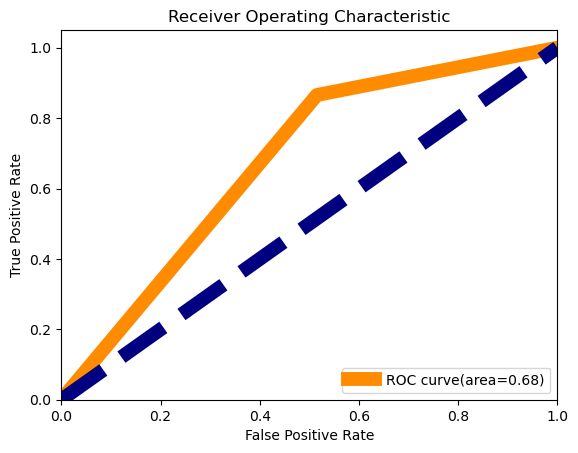

In [170]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)
plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label="ROC curve(area=%0.2f)" %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver Operating Characteristic")
plt.legend(loc='lower right')
plt.show()

area under the curve is 68%

RANDOM FOREST CLASSIFIER

In [171]:
# importing modules

from sklearn.ensemble import RandomForestClassifier

#creating RandomForestClassifier constructor
rf = RandomForestClassifier(random_state=5)
# fit data
rf.fit(x_train_res,y_train_res.ravel())
# predicting score
pred_test_rf=rf.predict(new_xtest)
pred_train_rf=rf.predict(x_train_res)
#calculates score of the model using score method
rf_score = rf.score(new_xtest,y_test)
print('score of model is : ',rf_score*100)

score of model is :  77.5


In [172]:
print("Accuracy Score of Training Data is:",accuracy_score(y_train_res.ravel(),pred_train_rf)*100)
print("Accuracy Score of Testing Data is:",accuracy_score(y_test,pred_test_rf)*100)

        

Accuracy Score of Training Data is: 100.0
Accuracy Score of Testing Data is: 77.5


In [173]:
#choosing best Random state
for i in range(0,100):
    rf.fit(x_train_res, y_train_res.ravel())
    pred_train_rf=rf.predict(x_train_res)
    pred_test_rf=rf.predict(new_xtest)
    if round(accuracy_score(y_train_res.ravel(),pred_train_rf)*100,1)== round(accuracy_score(y_test,pred_test_rf)*100,1):
        print("At random state ",i,"model performs well")
        print("At random state:-",i)
        print("Training r2_score is :-",accuracy_score(y_train_res.ravel(),pred_train_rf)*100)
        print("Testing r2_score is :-",accuracy_score(y_test,pred_test_rf)*100)
        

In [174]:
print("accuracy score is:",accuracy_score(y_test,pred_test_rf)*100)

accuracy score is: 77.5


In [175]:
#cross validation 
from sklearn.model_selection import cross_val_score
acc_score_rf=accuracy_score(y_test,pred_test_rf)
for j in range(2,10):
    cross_V_score=cross_val_score(rf,x,y,cv=j)
    print("At cv:-",j)
    print("cross validation score is:",acc_score_rf*100)
    print("accuracy score is:",acc_score_rf*100)
    print("\n")
        

At cv:- 2
cross validation score is: 77.5
accuracy score is: 77.5


At cv:- 3
cross validation score is: 77.5
accuracy score is: 77.5


At cv:- 4
cross validation score is: 77.5
accuracy score is: 77.5


At cv:- 5
cross validation score is: 77.5
accuracy score is: 77.5


At cv:- 6
cross validation score is: 77.5
accuracy score is: 77.5


At cv:- 7
cross validation score is: 77.5
accuracy score is: 77.5


At cv:- 8
cross validation score is: 77.5
accuracy score is: 77.5


At cv:- 9
cross validation score is: 77.5
accuracy score is: 77.5




parameter tuning

In [176]:
#performs GridSearchCV on RandomForestClassifier
from sklearn.model_selection import GridSearchCV
parameters={'criterion':['gini', 'entropy'],'n_estimators':[50,100],'max_features':['auto', 'sqrt', 'log2'],'random_state':list(range(0,1)),'min_weight_fraction_leaf':[0.1,0.2],'bootstrap':[True,False]}
rf=RandomForestClassifier()
clf=GridSearchCV(rf,parameters)
clf.fit(x_train_res,y_train_res.ravel())
print(clf.best_params_)


{'bootstrap': True, 'criterion': 'gini', 'max_features': 'log2', 'min_weight_fraction_leaf': 0.1, 'n_estimators': 50, 'random_state': 0}


In [177]:
rf=RandomForestClassifier(criterion="entropy",max_features="auto",n_estimators=50,random_state=2,bootstrap="True",min_weight_fraction_leaf= 0.1)
rf.fit(x_train_res,y_train_res.ravel())
pred_test_rf=rf.predict(new_xtest)
pred_train_rf=rf.predict(x_train_res)
rf_score = rf.score(x_train_res,y_train_res)
rf_acc_score=accuracy_score(y_test,pred_test)
print("Accuracy score is:",rf_acc_score*100)
print("score of model is:",rf_score*100)

Accuracy score is: 74.0
score of model is: 82.36272878535775


In [178]:
cv_score_rf=cross_val_score(rf,x,y,cv=5)
cv_mean_rf=cv_score_rf.mean()
print("cv_mean is:",cv_mean_rf*100)

cv_mean is: 75.32613065326632


In [179]:
print(confusion_matrix(y_test,pred_test_rf))

[[ 26  24]
 [ 24 126]]


In [180]:
print(classification_report(y_test,pred_test_rf))

              precision    recall  f1-score   support

           0       0.52      0.52      0.52        50
           1       0.84      0.84      0.84       150

    accuracy                           0.76       200
   macro avg       0.68      0.68      0.68       200
weighted avg       0.76      0.76      0.76       200



AUC-ROC CURVE:

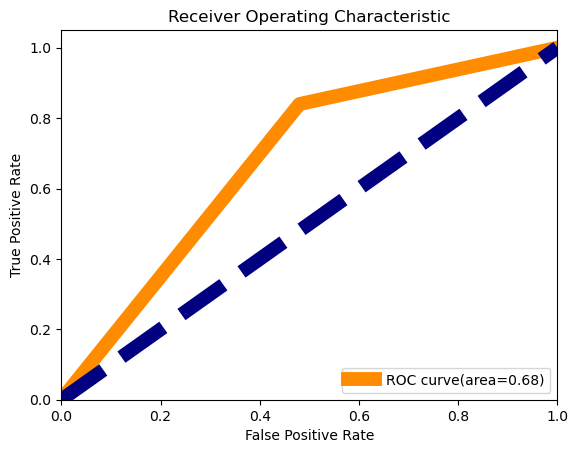

In [181]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds=roc_curve(pred_test_rf,y_test)
roc_auc=auc(fpr,tpr)
plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label="ROC curve(area=%0.2f)" %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver Operating Characteristic")
plt.legend(loc='lower right')
plt.show()

area under the curve is 68%

DECISION TREE CLASSIFIER

In [182]:
from sklearn.tree import DecisionTreeClassifier
dtc= DecisionTreeClassifier(random_state=1)
dtc.fit(x_train_res, y_train_res.ravel())
pred_test_dtc = dtc.predict(new_xtest)
pred_train_dtc = dtc.predict(x_train_res)
dtc_score = dtc.score(new_xtest,y_test)
print('score of model is : ',dtc_score*100)



score of model is :  79.5


In [183]:
print("Accuracy Score of Training Data is:",accuracy_score(y_train_res.ravel(),pred_train_dtc)*100)
print("Accuracy Score of Testing Data is:",accuracy_score(y_test,pred_test_dtc)*100)


Accuracy Score of Training Data is: 100.0
Accuracy Score of Testing Data is: 79.5


parameter tuning

In [184]:
#perform gridsearchcv and cross val score on Decison Tree DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
parameters={'criterion':['gini', 'entropy'],'splitter':['best','random'],'max_features':['auto', 'sqrt', 'log2'],'random_state':list(range(0,10)),'max_depth':[11],'min_samples_split': [2,3,4],'min_samples_leaf':[1,2,3] }
dt=DecisionTreeClassifier()
clf=GridSearchCV(dt,parameters)
clf.fit(x_train_res,y_train_res.ravel())
print(clf.best_params_)

{'criterion': 'entropy', 'max_depth': 11, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 2, 'splitter': 'best'}


In [185]:
dt=DecisionTreeClassifier(criterion='gini',max_features= 'auto',max_depth= 11 , random_state= 3, splitter= 'random',min_samples_leaf= 3,min_samples_split= 2)
dt.fit(x_train_res,y_train_res.ravel())
pred_test_dt=dt.predict(new_xtest)
pred_train_dt=dt.predict(x_train_res)
dt_score = dt.score(x_train_res,y_train_res.ravel())
dt_acc_score=accuracy_score(y_test,pred_test_dt)
print("Accuracy score is:",dt_acc_score*100)
print("score of model is:",dt_score*100)

Accuracy score is: 59.0
score of model is: 87.27121464226289


In [186]:
cv_score_dt=cross_val_score(dt,x,y,cv=5)
cv_mean_dt=cv_score_dt.mean()
print("cv_mean is:",cv_mean_dt*100)

cv_mean is: 72.11055276381909


In [187]:
print(confusion_matrix(y_test,pred_test_dtc))

[[ 28  22]
 [ 19 131]]


In [188]:
print(classification_report(y_test,pred_test_dtc))

              precision    recall  f1-score   support

           0       0.60      0.56      0.58        50
           1       0.86      0.87      0.86       150

    accuracy                           0.80       200
   macro avg       0.73      0.72      0.72       200
weighted avg       0.79      0.80      0.79       200



AUC-ROC CURVE:

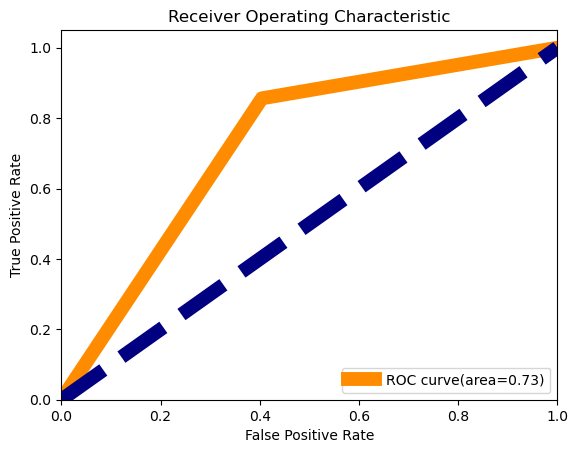

In [189]:
# ROC_AUC CURVE
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds=roc_curve(pred_test_dtc,y_test)
roc_auc=auc(fpr,tpr)
plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label="ROC curve(area=%0.2f)" %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver Operating Characteristic")
plt.legend(loc='lower right')
plt.show()

area under the curve is 73%

KNEIGHBORS CLASSIFIER

In [190]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(x_train_res, y_train_res.ravel())
pred_test_knn = knn.predict(new_xtest)
pred_train_knn = knn.predict(x_train_res)
knn_score = knn.score(new_xtest,y_test)
print('score of model is : ',knn_score*100)



score of model is :  50.5


In [191]:
print("Accuracy Score of Training Data is:",accuracy_score(y_train_res.ravel(),pred_train_knn)*100)
print("Accuracy Score of Testing Data is:",accuracy_score(y_test,pred_test_knn)*100)


Accuracy Score of Training Data is: 79.11813643926789
Accuracy Score of Testing Data is: 50.5


parameter tuning

In [192]:
#perform gridsearchcv and cross val score on KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

parameters={'n_neighbors':[4,5,6],'weights':['uniform', 'distance'],'leaf_size':[35,30],'n_jobs':[-1,1],'algorithm':['auto', 'ball_tree', 'kd_tree', 'brute'] }
knn=KNeighborsClassifier()
clf=GridSearchCV(knn,parameters)
clf.fit(x_train_res,y_train_res.ravel())
print(clf.best_params_)

{'algorithm': 'auto', 'leaf_size': 35, 'n_jobs': -1, 'n_neighbors': 4, 'weights': 'distance'}


In [193]:
knn=KNeighborsClassifier(algorithm= 'auto', leaf_size= 35, n_jobs= -1, n_neighbors= 6, weights= 'uniform')
knn.fit(x_train_res,y_train_res.ravel())
pred_test_knn=knn.predict(new_xtest)
pred_train_knn=knn.predict(x_train_res)
knn_score = knn.score(x_train_res,y_train_res.ravel())
knn_acc_score=accuracy_score(y_test,pred_test_knn)
print("Accuracy score is:",knn_acc_score*100)
print("score of model is:",knn_score*100)

Accuracy score is: 49.0
score of model is: 72.12978369384359


In [194]:
cv_score_knn=cross_val_score(knn,x,y,cv=5)
cv_mean_knn=cv_score_knn.mean()
print("cv_mean is:",cv_mean_knn*100)

cv_mean is: 72.01708542713567


In [195]:
print(confusion_matrix(y_test,pred_test_knn))

[[38 12]
 [90 60]]


In [196]:
print(classification_report(y_test,pred_test_knn))

              precision    recall  f1-score   support

           0       0.30      0.76      0.43        50
           1       0.83      0.40      0.54       150

    accuracy                           0.49       200
   macro avg       0.57      0.58      0.48       200
weighted avg       0.70      0.49      0.51       200



AUC-ROC CURVE:

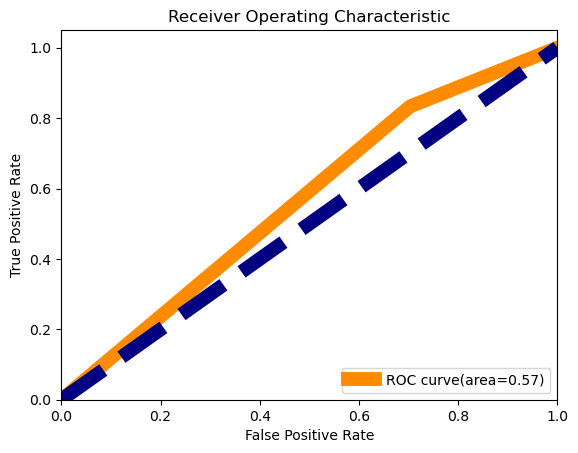

In [197]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds=roc_curve(pred_test_knn,y_test)
roc_auc=auc(fpr,tpr)
plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label="ROC curve(area=%0.2f)" %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver Operating Characteristic")
plt.legend(loc='lower right')
plt.show()

area under the curve is 57%

GAUSSIANNB

In [198]:
from sklearn.naive_bayes import GaussianNB
gnb= GaussianNB()
gnb.fit(x_train_res, y_train_res.ravel())
pred_test_gnb = gnb.predict(new_xtest)
pred_train_gnb = gnb.predict(x_train_res)
gnb_score = gnb.score(new_xtest,y_test)
print('score of model is : ',gnb_score*100)

score of model is :  66.5


In [199]:
print("Accuracy Score of Training Data is:",accuracy_score(y_train_res.ravel(),pred_train_gnb)*100)
print("Accuracy Score of Testing Data is:",accuracy_score(y_test,pred_test_gnb)*100)


Accuracy Score of Training Data is: 77.6206322795341
Accuracy Score of Testing Data is: 66.5


parameter tuning

In [200]:
#perform gridsearchcv and cross val score on GaussianNB
from sklearn.model_selection import GridSearchCV
params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gnb=GaussianNB() 
clf = GridSearchCV(estimator=gnb, 
                 param_grid=params_NB, 
                 cv=5,   # use any cross validation technique 
                 verbose=1, 
                 scoring='accuracy') 
clf.fit(x_train_res,y_train_res.ravel())
print(clf.best_params_)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
{'var_smoothing': 0.0008111308307896872}


In [201]:
gnb=GaussianNB(var_smoothing=0.15199110829529336)
gnb.fit(x_train_res,y_train_res.ravel())
pred_test_gnb=gnb.predict(new_xtest)
pred_train_gnb=gnb.predict(x_train_res)
gnb_score = gnb.score(x_train_res,y_train_res.ravel())
gnb_acc_score=accuracy_score(y_test,pred_test_gnb)
print("Accuracy score is:",gnb_acc_score*100)
print("score of model is:",gnb_score*100)

Accuracy score is: 60.5
score of model is: 72.46256239600666


In [202]:
cv_score_gnb=cross_val_score(gnb,x,y,cv=5)
cv_mean_gnb=cv_score_gnb.mean()
print("cv_mean is:",cv_mean_gnb*100)




cv_mean is: 78.13668341708542


In [203]:
print(confusion_matrix(y_test,pred_test_gnb))

[[38 12]
 [67 83]]


In [204]:
print(classification_report(y_test,pred_test_gnb))

              precision    recall  f1-score   support

           0       0.36      0.76      0.49        50
           1       0.87      0.55      0.68       150

    accuracy                           0.60       200
   macro avg       0.62      0.66      0.58       200
weighted avg       0.75      0.60      0.63       200



AUC-ROC CURVE:

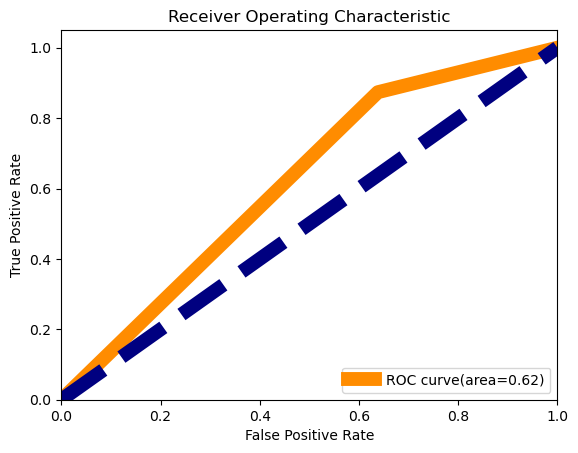

In [205]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds=roc_curve(pred_test_gnb,y_test)
roc_auc=auc(fpr,tpr)
plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label="ROC curve(area=%0.2f)" %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver Operating Characteristic")
plt.legend(loc='lower right')
plt.show()

area under the curve is 62%

SUPPROT VECTOR CLASSIFIER

In [206]:
from sklearn.svm import SVC
svc = SVC(kernel='rbf')
svc.fit(x_train_res, y_train_res.ravel())
pred_test_svc = svc.predict(new_xtest)
pred_train_svc = svc.predict(x_train_res)
svc_score = svc.score(new_xtest,y_test)
print('score of model is : ',svc_score*100)

score of model is :  69.5


In [207]:
print("Accuracy Score of Training Data is:",accuracy_score(y_train_res.ravel(),pred_train_svc)*100)
print("Accuracy Score of Testing Data is:",accuracy_score(y_test,pred_test_svc)*100)


Accuracy Score of Training Data is: 94.75873544093179
Accuracy Score of Testing Data is: 69.5


parameter tuning

In [208]:
#perform gridsearchcv and cross val score on Support Vector classifier

parameters ={'kernel':['linear','rbf'],'tol':[0.01,0.001],'shrinking':[True,False],'max_iter':[1,-1],'probability':[True,False]}
svc=SVC()
clf=GridSearchCV(svc,parameters)
clf.fit(x_train_res,y_train_res.ravel())
print(clf.best_params_)


{'kernel': 'rbf', 'max_iter': -1, 'probability': True, 'shrinking': True, 'tol': 0.001}


In [209]:
svc=SVC(kernel='rbf',gamma='scale',degree= 3,max_iter= -1, probability= True, shrinking= True, tol= 0.01)
svc.fit(x_train_res,y_train_res.ravel())
pred_test_svc=svc.predict(new_xtest)
pred_train_svc=svc.predict(x_train_res)
svc_score = svc.score(x_train_res,y_train_res.ravel())
svc_acc_score=accuracy_score(y_test,pred_test)
print("Accuracy score is:",svc_acc_score*100)
print("score of model is:",svc_score*100)

Accuracy score is: 74.0
score of model is: 94.75873544093179


In [210]:
cv_score_svc=cross_val_score(svc,x,y,cv=5)
cv_mean_svc=cv_score_svc.mean()
print("cv_mean is:",cv_mean_svc*100)

cv_mean is: 74.12211055276381


In [211]:
print(confusion_matrix(y_test,pred_test_svc))

[[ 18  32]
 [ 30 120]]


In [212]:
print(classification_report(y_test,pred_test_svc))

              precision    recall  f1-score   support

           0       0.38      0.36      0.37        50
           1       0.79      0.80      0.79       150

    accuracy                           0.69       200
   macro avg       0.58      0.58      0.58       200
weighted avg       0.69      0.69      0.69       200



AUC-ROC CURVE:

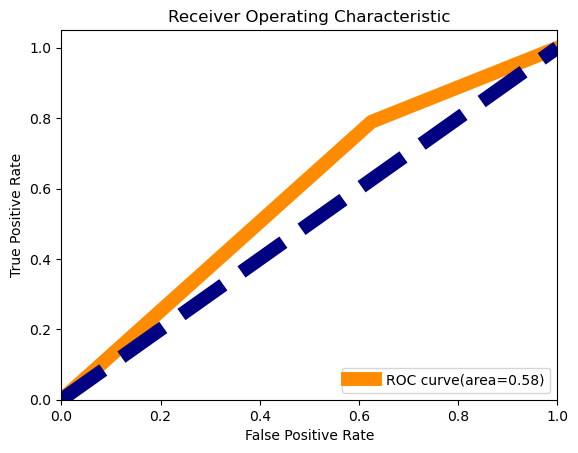

In [213]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds=roc_curve(pred_test_svc,y_test)
roc_auc=auc(fpr,tpr)
plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label="ROC curve(area=%0.2f)" %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver Operating Characteristic")
plt.legend(loc='lower right')
plt.show()

area under the curve is 58%

In [214]:
#Gradient Boosting Classifier

GRADIENT BOOSTING CLASSIFIER

In [215]:
from sklearn.ensemble import GradientBoostingClassifier

gb = GradientBoostingClassifier(random_state=7)
gb.fit(x_train_res, y_train_res)
pred_test_gb = gb.predict(new_xtest)
pred_train_gb = gb.predict(x_train_res)
gb_score = gb.score(new_xtest,y_test)
print('score of model is : ',gb_score*100)




score of model is :  80.0


In [216]:
print("Accuracy Score of Training Data is:",accuracy_score(y_train_res.ravel(),pred_train_gb)*100)
print("Accuracy Score of Testing Data is:",accuracy_score(y_test,pred_test_gb)*100)

Accuracy Score of Training Data is: 96.33943427620633
Accuracy Score of Testing Data is: 80.0


parameter tuning

In [217]:
from sklearn.model_selection import GridSearchCV
parameters={'criterion':['squared_error','mse'],'n_estimators':[150],'random_state':list(range(0,1)),'min_weight_fraction_leaf':[0.1,0.2] }
gb=GradientBoostingClassifier()
clf=GridSearchCV(gb,parameters)
clf.fit(x_train_res,y_train_res.ravel())
print(clf.best_params_)


{'criterion': 'squared_error', 'min_weight_fraction_leaf': 0.1, 'n_estimators': 150, 'random_state': 0}


In [218]:
gb=GradientBoostingClassifier(criterion="mse",n_estimators=100,random_state=0,min_weight_fraction_leaf= 0.1)
gb.fit(x_train_res,y_train_res.ravel())
pred_test_gb=gb.predict(new_xtest)
pred_train_gb=gb.predict(x_train_res)
gb_score = gb.score(x_train_res,y_train_res.ravel())
gb_acc_score=accuracy_score(y_test,pred_test)
print("Accuracy score is:",gb_acc_score*100)
print("score of model is:",gb_score*100)

Accuracy score is: 74.0
score of model is: 92.84525790349417


In [219]:
cv_score_gb=cross_val_score(gb,x,y,cv=5)
cv_mean_gb=cv_score_gb.mean()
print("cv_mean is:",cv_mean_gb*100)

cv_mean is: 80.54321608040202


In [220]:
print(confusion_matrix(y_test,pred_test_gb))

[[ 38  12]
 [ 26 124]]


In [221]:
print(classification_report(y_test,pred_test_gb))

              precision    recall  f1-score   support

           0       0.59      0.76      0.67        50
           1       0.91      0.83      0.87       150

    accuracy                           0.81       200
   macro avg       0.75      0.79      0.77       200
weighted avg       0.83      0.81      0.82       200



AUC-ROC CURVE:

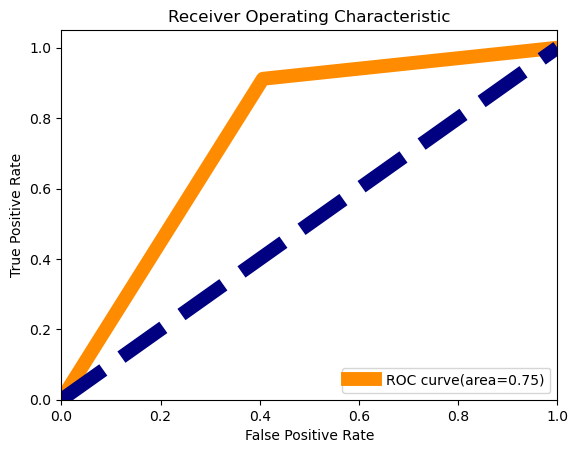

In [222]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds=roc_curve(pred_test_gb,y_test)
roc_auc=auc(fpr,tpr)
plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label="ROC curve(area=%0.2f)" %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver Operating Characteristic")
plt.legend(loc='lower right')
plt.show()

area under the curve is 75%

LIGHT GRADIENT BOOSTING CLASSIFIER

In [1]:
!pip install lightgbm

In [224]:
#Light Gradient Boosting Classifier

In [225]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier()
lgbm.fit(x_train_res, y_train_res.ravel())
pred_test_lgbm = lgbm.predict(new_xtest)
pred_train_lgbm = lgbm.predict(x_train_res)
lgbm_score = lgbm.score(new_xtest,y_test)
print('score of model is : ',lgbm_score*100)



score of model is :  81.5


In [226]:
print("Accuracy Score of Training Data is:",accuracy_score(y_train_res.ravel(),pred_train_lgbm)*100)
print("Accuracy Score of Testing Data is:",accuracy_score(y_test,pred_test_lgbm)*100)


Accuracy Score of Training Data is: 100.0
Accuracy Score of Testing Data is: 81.5


In [227]:
print(confusion_matrix(y_test,pred_test_lgbm))

[[ 34  16]
 [ 21 129]]


In [228]:
print(classification_report(y_test,pred_test_lgbm))

              precision    recall  f1-score   support

           0       0.62      0.68      0.65        50
           1       0.89      0.86      0.87       150

    accuracy                           0.81       200
   macro avg       0.75      0.77      0.76       200
weighted avg       0.82      0.81      0.82       200



AUC-ROC CURVE:

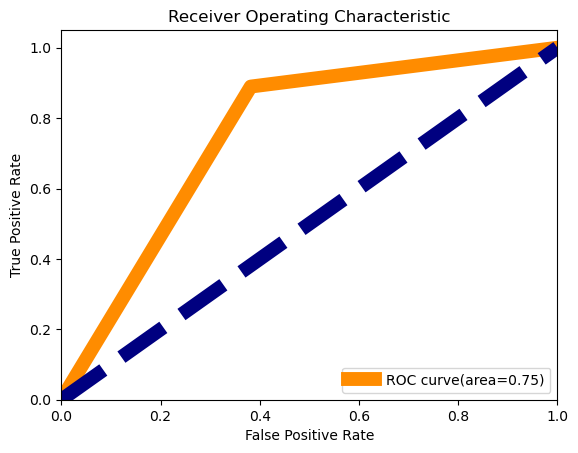

In [229]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds=roc_curve(pred_test_lgbm,y_test)
roc_auc=auc(fpr,tpr)
plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label="ROC curve(area=%0.2f)" %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver Operating Characteristic")
plt.legend(loc='lower right')
plt.show()

area under the curve is 75%

CAT BOOST CLASSIFIER

In [2]:
!pip install catboost

In [231]:
from catboost import CatBoostClassifier

cat = CatBoostClassifier()
cat.fit(x_train_res, y_train_res.ravel())
pred_test_cat = cat.predict(new_xtest)
pred_train_cat = cat.predict(x_train_res)
cat_score = cat.score(new_xtest,y_test)
print('score of model is : ',cat_score*100)



Learning rate set to 0.011144
0:	learn: 0.6835018	total: 172ms	remaining: 2m 51s
1:	learn: 0.6742303	total: 175ms	remaining: 1m 27s
2:	learn: 0.6647040	total: 178ms	remaining: 59.1s
3:	learn: 0.6572799	total: 180ms	remaining: 44.9s
4:	learn: 0.6513042	total: 183ms	remaining: 36.3s
5:	learn: 0.6439524	total: 185ms	remaining: 30.6s
6:	learn: 0.6359112	total: 188ms	remaining: 26.6s
7:	learn: 0.6291019	total: 190ms	remaining: 23.5s
8:	learn: 0.6229234	total: 192ms	remaining: 21.2s
9:	learn: 0.6183216	total: 195ms	remaining: 19.3s
10:	learn: 0.6119126	total: 197ms	remaining: 17.7s
11:	learn: 0.6041906	total: 200ms	remaining: 16.5s
12:	learn: 0.5997267	total: 202ms	remaining: 15.4s
13:	learn: 0.5930614	total: 205ms	remaining: 14.4s
14:	learn: 0.5854609	total: 207ms	remaining: 13.6s
15:	learn: 0.5788350	total: 209ms	remaining: 12.8s
16:	learn: 0.5748660	total: 211ms	remaining: 12.2s
17:	learn: 0.5677211	total: 214ms	remaining: 11.7s
18:	learn: 0.5612278	total: 216ms	remaining: 11.1s
19:	learn

In [232]:
print("Accuracy Score of Training Data is:",accuracy_score(y_train_res.ravel(),pred_train_cat)*100)
print("Accuracy Score of Testing Data is:",accuracy_score(y_test,pred_test_cat)*100)


Accuracy Score of Training Data is: 99.91680532445923
Accuracy Score of Testing Data is: 83.0


In [233]:
print(confusion_matrix(y_test,pred_test_cat))

[[ 37  13]
 [ 21 129]]


In [234]:
print(classification_report(y_test,pred_test_cat))

              precision    recall  f1-score   support

           0       0.64      0.74      0.69        50
           1       0.91      0.86      0.88       150

    accuracy                           0.83       200
   macro avg       0.77      0.80      0.78       200
weighted avg       0.84      0.83      0.83       200



AUC-ROC CURVE:

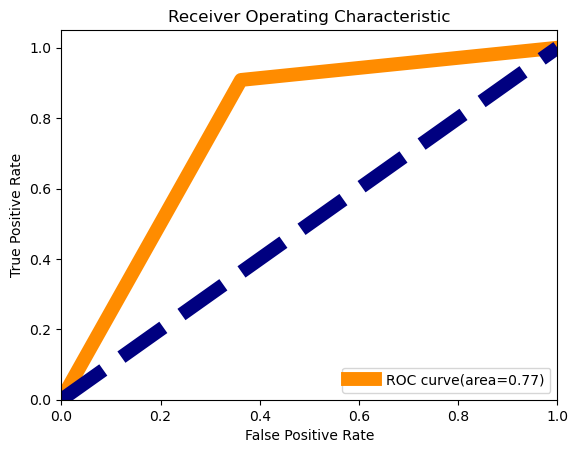

In [235]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds=roc_curve(pred_test_cat,y_test)
roc_auc=auc(fpr,tpr)
plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label="ROC curve(area=%0.2f)" %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver Operating Characteristic")
plt.legend(loc='lower right')
plt.show()

area under the curve is 77%

EXTRA TREE CLASSIFIER

In [236]:
from sklearn.ensemble import ExtraTreesClassifier
etc = ExtraTreesClassifier()
etc.fit(x_train_res, y_train_res.ravel())
pred_test_etc = etc.predict(new_xtest)
pred_train_etc = etc.predict(x_train_res)
etc_score = etc.score(new_xtest,y_test)
print('score of model is : ',etc_score*100)

score of model is :  73.0


In [237]:
print(confusion_matrix(y_test,pred_test_etc))

[[ 15  35]
 [ 19 131]]


In [238]:
print(classification_report(y_test,pred_test_etc))

              precision    recall  f1-score   support

           0       0.44      0.30      0.36        50
           1       0.79      0.87      0.83       150

    accuracy                           0.73       200
   macro avg       0.62      0.59      0.59       200
weighted avg       0.70      0.73      0.71       200



AUC-ROC CURVE:

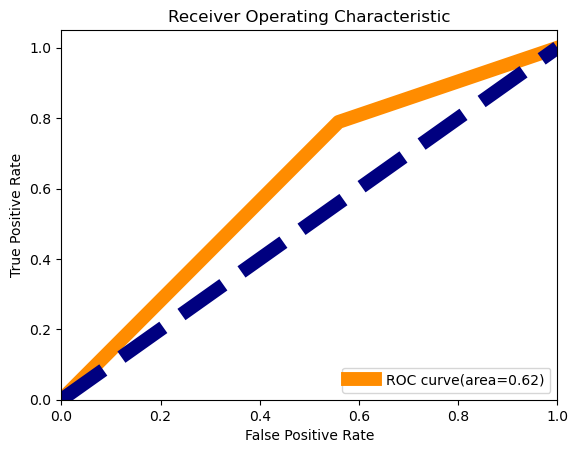

In [239]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds=roc_curve(pred_test_etc,y_test)
roc_auc=auc(fpr,tpr)
plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label="ROC curve(area=%0.2f)" %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver Operating Characteristic")
plt.legend(loc='lower right')
plt.show()

area under the curve is 62%

ADA BOOST CLASSIFIER

In [240]:
from sklearn.ensemble import AdaBoostClassifier
abc = AdaBoostClassifier(random_state=40,n_estimators=50,base_estimator=svc,algorithm='SAMME',learning_rate=0.05)
abc.fit(x_train_res, y_train_res.ravel())
pred_test_abc = abc.predict(new_xtest)
pred_train_abc = abc.predict(x_train_res)
abc_score = abc.score(new_xtest,y_test)
print('score of model is : ',abc_score*100)



score of model is :  68.5


In [241]:
print(confusion_matrix(y_test,pred_test_abc))

[[ 23  27]
 [ 36 114]]


In [242]:
print(classification_report(y_test,pred_test_abc))

              precision    recall  f1-score   support

           0       0.39      0.46      0.42        50
           1       0.81      0.76      0.78       150

    accuracy                           0.69       200
   macro avg       0.60      0.61      0.60       200
weighted avg       0.70      0.69      0.69       200



AUC-ROC CURVE:

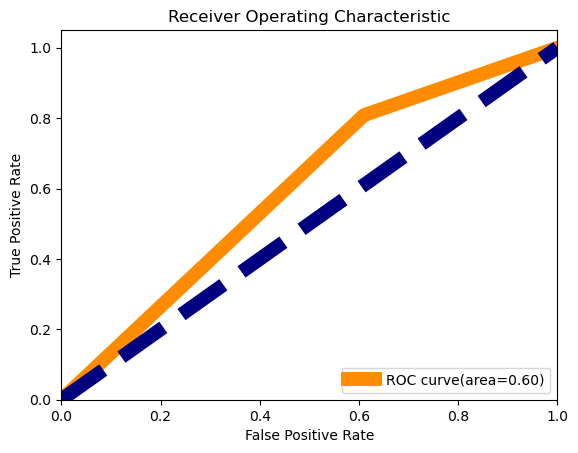

In [243]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds=roc_curve(pred_test_abc,y_test)
roc_auc=auc(fpr,tpr)
plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label="ROC curve(area=%0.2f)" %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver Operating Characteristic")
plt.legend(loc='lower right')
plt.show()

area under the curve is 60%

XGBOOST

In [3]:
!pip install xgboost


^C


In [245]:
import xgboost as xgb
xgb = xgb.XGBClassifier()
xgb.fit(x_train_res, y_train_res.ravel())
pred_test_xgb = xgb.predict(new_xtest)
pred_train_xgb = xgb.predict(x_train_res)
xgb_score = xgb.score(new_xtest,y_test)
print('score of model is : ',xgb_score*100)




[21:54:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
score of model is :  82.0


In [246]:
print(confusion_matrix(y_test,pred_test_xgb))

[[ 35  15]
 [ 21 129]]


In [247]:
print(classification_report(y_test,pred_test_xgb))

              precision    recall  f1-score   support

           0       0.62      0.70      0.66        50
           1       0.90      0.86      0.88       150

    accuracy                           0.82       200
   macro avg       0.76      0.78      0.77       200
weighted avg       0.83      0.82      0.82       200



AUC-ROC CURVE:

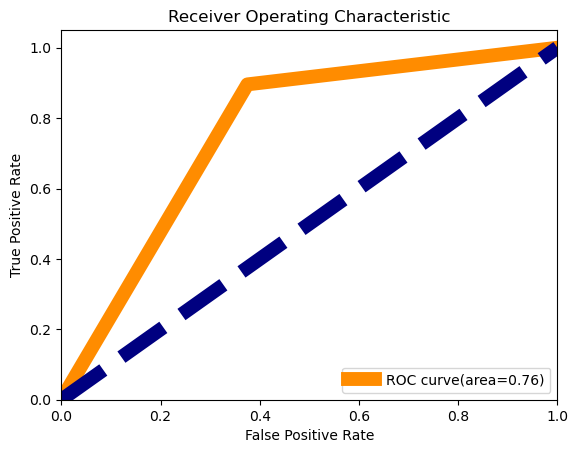

In [248]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds=roc_curve(pred_test_xgb,y_test)
roc_auc=auc(fpr,tpr)
plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label="ROC curve(area=%0.2f)" %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver Operating Characteristic")
plt.legend(loc='lower right')
plt.show()

area under the curve is 76%


VOTING CLASSIFIER

In [249]:
from sklearn.ensemble import VotingClassifier
estimator=[]
estimator.append(('knn',KNeighborsClassifier()))
estimator.append(('svc',SVC(gamma='auto',probability=True)))
estimator.append(('dtc',DecisionTreeClassifier()))
estimator

[('knn', KNeighborsClassifier()),
 ('svc', SVC(gamma='auto', probability=True)),
 ('dtc', DecisionTreeClassifier())]

HARD VOTING CLASSIFIER

In [250]:
vot_hard=VotingClassifier(estimators=estimator,voting='hard')
vot_hard.fit(x_train_res,y_train_res.ravel())
y_pred_vot_h=vot_hard.predict(new_xtest)
print(y_pred_vot_h)
vot_h_score=accuracy_score(y_test,y_pred_vot_h)
print("Hard Voting Score %d" %vot_h_score)

[1 1 0 1 1 1 0 0 1 0 1 1 0 1 0 1 1 1 1 1 0 1 1 0 1 1 1 1 0 0 1 1 1 1 1 1 1
 1 1 1 1 0 0 1 0 1 1 1 1 1 1 1 0 1 1 1 0 1 1 0 0 1 0 1 1 1 1 1 1 1 1 1 1 1
 0 1 1 1 1 0 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 1 0 0 0 1 1 1 1
 1 1 1 1 1 1 1 0 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 0 0 0 0 1 0
 1 1 0 0 1 0 1 0 0 0 1 1 1 1 1 0 1 1 0 0 1 1 1 0 0 0 1 1 1 1 1 0 1 0 1 0 1
 1 0 0 1 0 1 0 1 1 1 0 0 1 0 1]
Hard Voting Score 0


SOFT VOTING CLASSIFIER

In [251]:
vot_hard=VotingClassifier(estimators=estimator,voting='soft')
vot_hard.fit(x_train_res,y_train_res.ravel())
y_pred_vot_s=vot_hard.predict(new_xtest)
print(y_pred_vot_s)
vot_s_score=accuracy_score(y_test,y_pred_vot_s)
print("Soft Voting Score %d" %vot_s_score)

[1 1 0 1 1 0 0 0 1 0 1 1 0 1 0 1 1 1 1 1 0 1 1 0 1 1 1 1 0 0 1 1 0 1 1 1 1
 1 0 1 1 1 0 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1
 0 1 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 1 1 1 0 0 1 1 1 1
 1 1 1 1 1 1 1 0 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 0 1 0 1 1 1 0 0 0 0 1 0
 1 1 0 0 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 0 1 0 1 1 1 1 1 0 1 0 1 1 1
 1 0 1 1 0 1 0 1 0 0 0 0 1 1 1]
Soft Voting Score 0


AUC-ROC CURVE:for Hard voting clasifier

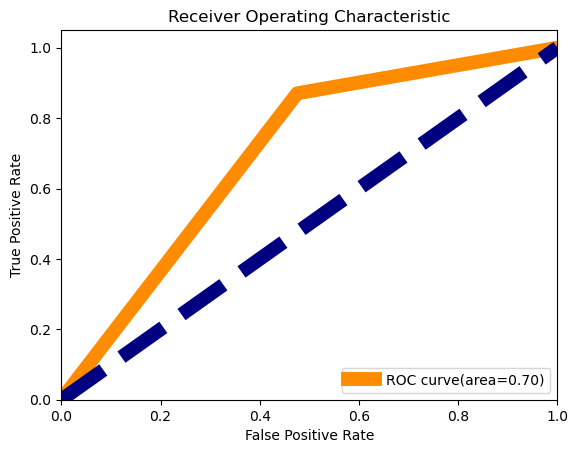

In [252]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds=roc_curve(y_pred_vot_h,y_test)
roc_auc=auc(fpr,tpr)
plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label="ROC curve(area=%0.2f)" %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver Operating Characteristic")
plt.legend(loc='lower right')
plt.show()

area under the curve is 70%

AUC-ROC CURVE:for soft voting clasifier

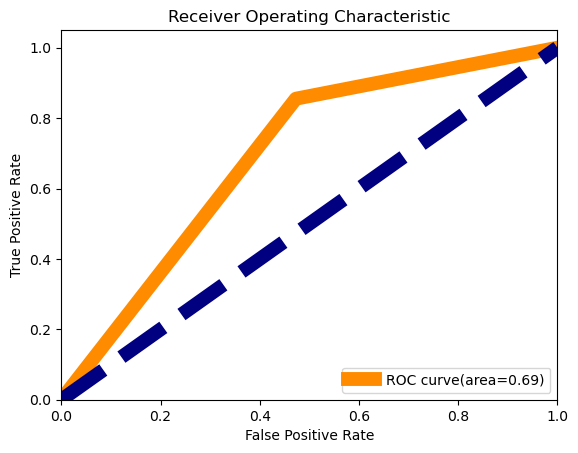

In [253]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds=roc_curve(y_pred_vot_s,y_test)
roc_auc=auc(fpr,tpr)
plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label="ROC curve(area=%0.2f)" %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver Operating Characteristic")
plt.legend(loc='lower right')
plt.show()

area under the curve is 69%

CONCLUSION


OUTPUT

In [272]:
import numpy as np
a=np.array(y_test)
predicted=np.array(cat.predict(new_xtest))
df_con=pd.DataFrame({"Original":a,"Predicted":predicted},index=range(len(a)))
df_con


,Original,Predicted
0,1,1
1,0,0
2,0,0
3,1,1
4,0,1
...,...,...
195,1,1
196,1,1
197,1,1
198,1,1


Text(0.5, 1.0, 'Predicted')

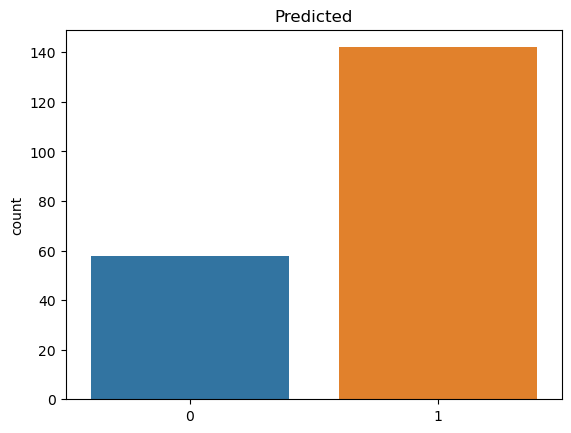

In [273]:
sns.countplot(x=predicted, data=df_con)
plt.title("Predicted")

Text(0.5, 1.0, 'Original')

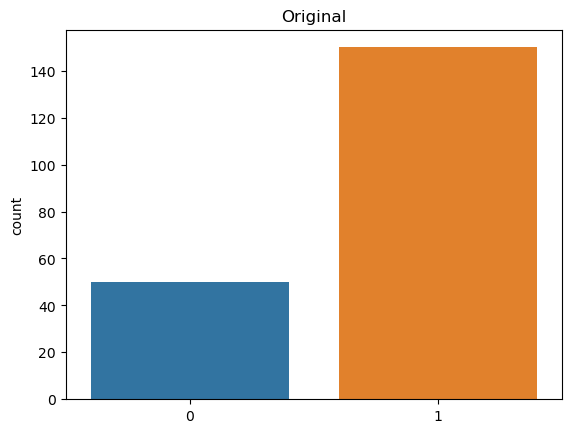

In [274]:
ax = sns.countplot(x=a, data=df)
plt.title("Original")

SAVE MODEL

In [275]:
import pickle
filename='Insurance_Claims_Fraud_Detection_cat.pkl'
pickle.dump(cat,open(filename,'wb'))


In [276]:
models=['LogisticRegression','RandomForestClassifier','DecisionTreeClassifier','KNeighborsClassifier','GaussianNB','SVC','Gradient Boosting Classifier','Light Gradient Boosting Classifier','CatBoostClassifier',
'ExtraTreesClassifier','AdaBoost','XGBoost','Voting classifier','Soft Voting Classifier']
        

In [277]:
scores=[(accuracy_score(y_test,pred_test)*100),accuracy_score(y_test,pred_test_rf)*100,accuracy_score(y_test,pred_test_dtc)*100,
       accuracy_score(y_test,pred_test_knn)*100,accuracy_score(y_test,pred_test_gnb)*100,accuracy_score(y_test,pred_test_svc)*100,
       accuracy_score(y_test,pred_test_gb)*100,accuracy_score(y_test,pred_test_lgbm)*100,accuracy_score(y_test,pred_test_cat)*100,
       accuracy_score(y_test,pred_test_etc)*100,accuracy_score(y_test,pred_test_abc)*100,accuracy_score(y_test,pred_test_xgb)*100,accuracy_score(y_test,y_pred_vot_h)*100,
       accuracy_score(y_test,y_pred_vot_s)*100]
scores

[74.0,
 76.0,
 79.5,
 49.0,
 60.5,
 69.0,
 81.0,
 81.5,
 83.0,
 73.0,
 68.5,
 82.0,
 76.5,
 76.5]

In [278]:
Nos=[]
for i in range(1,len(models)+1):
    Nos.append(i)
Nos    

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]

In [279]:
import pandas as pd
Model_scores=pd.DataFrame({})
Model_scores['Nos']=Nos
Model_scores['Model Names']=models
Model_scores['Scores']=scores
Model_scores.sort_values(by='Scores', ascending=False).style.hide_index()

Nos,Model Names,Scores
9,CatBoostClassifier,83.000000
12,XGBoost,82.000000
8,Light Gradient Boosting Classifier,81.500000
7,Gradient Boosting Classifier,81.000000
3,DecisionTreeClassifier,79.500000
13,Voting classifier,76.500000
14,Soft Voting Classifier,76.500000
2,RandomForestClassifier,76.000000
1,LogisticRegression,74.000000
10,ExtraTreesClassifier,73.000000


From the above models CatBoostClassifier performs well.
Because,CatBoost is the only boosting algorithm with very less prediction time. Thanks to its symmetric tree structure. It is comparatively 8x faster than XGBoost while predicting.
So we save this model for prediction

We can identify the fraud cases easily by analysing incident severity and claim amounts,incide type,incident state and collision type and other prominent factors.It is mainly can be get by incident details.

In [280]:
df_con.to_csv("Insurance_Claims_Fraud_Detection_cat.csv",sep='\t')